In [2]:
# All libraries & Data points
import jetset
print('tested on jetset',jetset.__version__)
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from jetset.data_loader import Data
from jetset.data_loader import ObsData
from jetset.plot_sedfit import PlotSED
from jetset.jet_model import Jet
from jetset.minimizer import fit_SED,ModelMinimizer
from jetset.model_manager import  FitModel
from jetset.sed_shaper import  SEDShape
from jetset.obs_constrain import ObsConstrain
from jetset.minimizer import fit_SED
from jetset.template_2Dmodel import EBLAbsorptionTemplate
from jetset.mcmc import McmcSampler
sed_data=ObsData.load('J163547_data.pkl')
plt.rcParams.update({'font.size': 14})
plt.rcParams['figure.dpi'] = 200
plt.rcParams["savefig.bbox"] = 'tight'

tested on jetset 1.2.2


# Unraveling the SMBH and its Nuclear Environment in NVSS J163547+362930 in the Early Universe

## Prefit obtained considering a SSD (see Prefit/Preprefit.ipynb)

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5


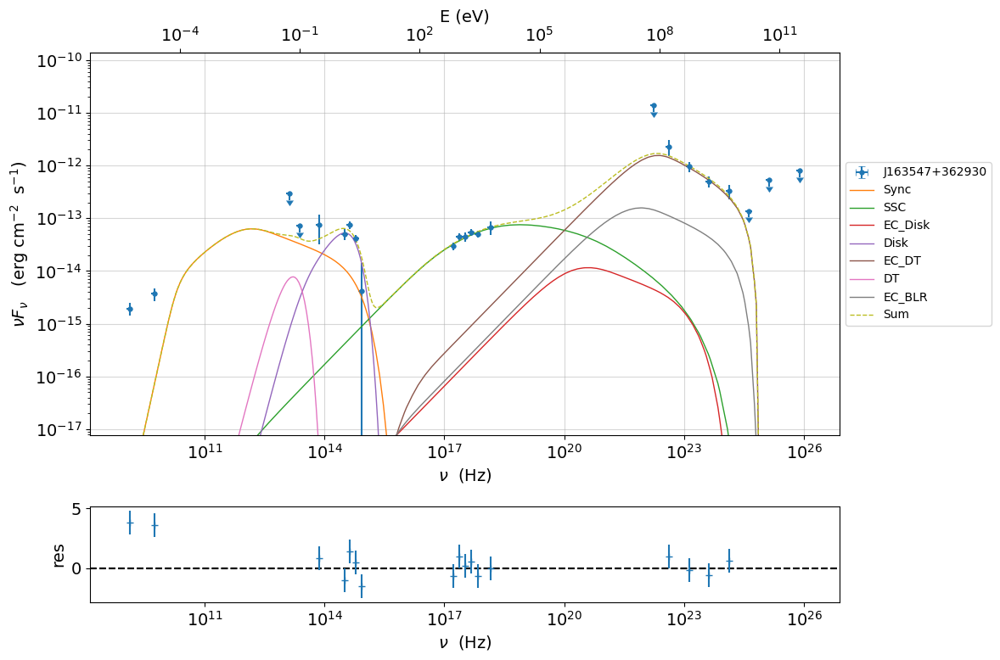

In [2]:
prefit_jet=Jet(name='jet_leptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
prefit_jet.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
prefit_jet.add_user_par(name='theta_open',val=3,units='deg')
prefit_jet.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
prefit_jet.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
prefit_jet.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
prefit_jet.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

gmin=1
gmax=20000
N=921.4208
gamma_break=946.3835
p=1.446258
p_1=3.576325
T_DT=926.8273
R_DT=2.373137E+019
tau_DT=0.1
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.083
M_BH=1102905000
tau_BLR=0.1
R_BLR_in=3.559706E+017
R_BLR_out=3.915677E+017
L_Disk=1.407945E+046
R=7.861166E+016
R_H=1.5E+018
B=0.06558658
NH_cold_to_rel_e=0.1
theta=3
BulkFactor=19.03681
z_cosm=3.647763
theta_open=3

prefit_jet.set_par('gmin',val=gmin)
prefit_jet.set_par('gmax',val=gmax)
prefit_jet.set_par('N',val=N)
prefit_jet.set_par('gamma_break',val=gamma_break)
prefit_jet.set_par('p',val=p)
prefit_jet.set_par('p_1',val=p_1)
prefit_jet.set_par('R_inner_Sw',val=R_inner_Sw)
prefit_jet.set_par('R_ext_Sw',val=R_ext_Sw)
prefit_jet.set_par('accr_eff',val=accr_eff)
prefit_jet.set_par('M_BH',val=M_BH)
prefit_jet.set_par('T_DT',val=T_DT)
prefit_jet.set_par('tau_DT',val=tau_DT)
prefit_jet.set_par('tau_BLR',val=tau_BLR)
prefit_jet.set_par('L_Disk',val=L_Disk)
prefit_jet.set_par('R_H',val=R_H)
prefit_jet.set_par('B',val=B)
prefit_jet.set_par('theta',val=theta)
prefit_jet.set_par('theta',val=theta_open)
prefit_jet.set_par('BulkFactor',val=BulkFactor)
prefit_jet.set_par('z_cosm',val=z_cosm)
prefit_jet.eval()
p=prefit_jet.plot_model(sed_data=sed_data, frame='obs')
p.add_residual_plot(prefit_jet,sed_data)

# Fitting with diff. $\eta$ values

# $\eta=0.057$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False



--------------------------------------------------------------------------------
model description: 
--------------------------------------------------------------------------------
type: Jet
name: jet_leptonic  

electrons distribution:
 type: bkn  
 gamma energy grid size:  201
 gmin grid : 1.000000e+00
 gmax grid : 2.000000e+04
 normalization:  True
 log-values:  False
 ratio of cold protons to relativistic electrons: 1.000000e-01

accretion disk:
 disk Type: MultiBB
 L disk: 9.855615e+45 (erg/s)
 T disk: 2.945853e+04 (K)
 nu peak disk: 2.407295e+15 (Hz)
 Sw radius 3.257473e+14 (cm)
 L Edd. 1.838237e+47 (erg/s)
 accr_rate: 3.050289e+00 (M_sun/yr)
 accr_rate Edd.: 5.689301e+01 (M_sun/yr)

radiative fields:
 seed photons grid size:  100
 IC emission grid size:  100
 source emissivity lower bound :  1.000000e-120
 spectral components:
   name:Sum, state: on
   name:Sync, state: self-abs
   name:SSC, state: on
   name:EC_Disk, state: on
   name:Disk, state: on
   name:EC_DT, state: on


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,5.700000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False


--------------------------------------------------------------------------------


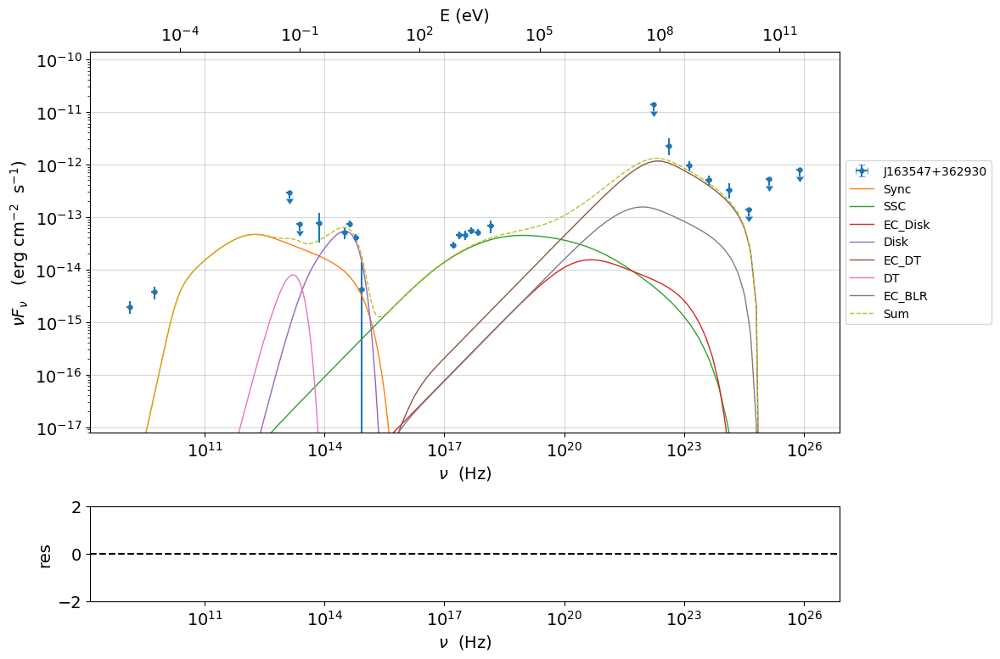

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 23

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.74584e+01

fit run: 1
- old chisq=3.74584e+01


0it [00:00, ?it/s]

- best chisq=3.74579e+01

fit run: 2
- old chisq=3.74579e+01


0it [00:00, ?it/s]

- best chisq=3.74579e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.057$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,1.148063e+03,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,8.829551e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.416318e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.609625e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,5.700000e-02,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.147953e+09,0.000000e+00,--,False,False



converged=True
calls=337
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 37.46                      │              Nfcn = 337              │
│ EDM = 0.0329 (Goal: 0.0002)      │           time = 109.7 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  1.15e3   │  0.23e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │  0.88e3   │  0.15e3   │            │            │   500   │  2000   │       │
│ 2 │ par_2 │   1.42    │   0.04    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │   3.61    │   0.21    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.148e9  │  0.023e9  │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │ 9.8561e45 │ 0.0034e45 │            │            │  5e+45  │  8e+46  │       │
│ 6 │ par_6 │ 1.2000e18 │ 0.0008e18 │            │            │  5e+17  │  3e+18  │       │
│ 7 │ par_7 │   0.08    │   0.06    │            │            │  0.02   │   0.1   │       │
│ 8 │ par_8 │    20     │     5     │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  5.44e+04  1.05e+04     -1.99     -25.8 -2.29e+09  -3.7e+44  -9.2e+16     -6.79      -369 │
│ par_1 │  1.05e+04  2.43e+04     -1.84     -9.25 -1.57e+09 -2.54e+44 -6.31e+16     -4.24      -335 │
│ par_2 │     -1.99     -1.84   0.00206   0.00475  4.36e+05  7.05e+40  1.75e+13   0.00128    0.0707 │
│ par_3 │     -25.8     -9.25   0.00475    0.0524  2.38e+06     4e+41  9.93e+13   0.00605     0.561 │
│ par_4 │ -2.29e+09 -1.57e+09  4.36e+05  2.38e+06  5.26e+14  6.29e+49  1.58e+22  5.11e+05 -3.05e+07 │
│ par_5 │  -3.7e+44 -2.54e+44  7.05e+40     4e+41  6.29e+49  1.16e+85  2.55e+57  8.35e+40 -4.93e+42 │
│ par_6 │  -9.2e+16 -6.31e+16  1.75e+13  9.93e+13  1.58e+22  2.55e+57  6.43e+29  2.07e+13 -1.23e+15 │
│ par_7 │     -6.79     -4.24   0.00128   0.00605  5.11e+05  8.35e+40  2.07e+13   0.00164     0.125 │
│ par_8 │      -369      -335    0.0707     0.561 -3.05e+07 -4.93e+42 -1.23e+15     0.125      36.5 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=14
chisq=37.457901, chisq/red=2.675564 null hypothesis sig=0.000629

stats without the UL
dof  UL=8
chisq=37.380347, chisq/red=4.672543 null hypothesis sig=0.000010


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,1.148063e+03,1.148063e+03,2.307969e+02,--,9.214208e+02,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,8.829551e+02,8.829551e+02,1.542683e+02,--,9.463835e+02,5.000000e+02,2.000000e+03,False
jet_leptonic,p,1.416318e+00,1.416318e+00,4.033822e-02,--,1.446258e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.609625e+00,3.609625e+00,2.120406e-01,--,3.576325e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,9.274387e+00,--,--,--,9.274387e+00,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.411660e+02,--,--,--,8.411660e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,5.700000e-02,--,--,--,5.700000e-02,0.000000e+00,--,True
jet_leptonic,M_BH,1.147953e+09,1.147953e+09,2.293230e+07,--,1.102905e+09,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


19.08769867000393


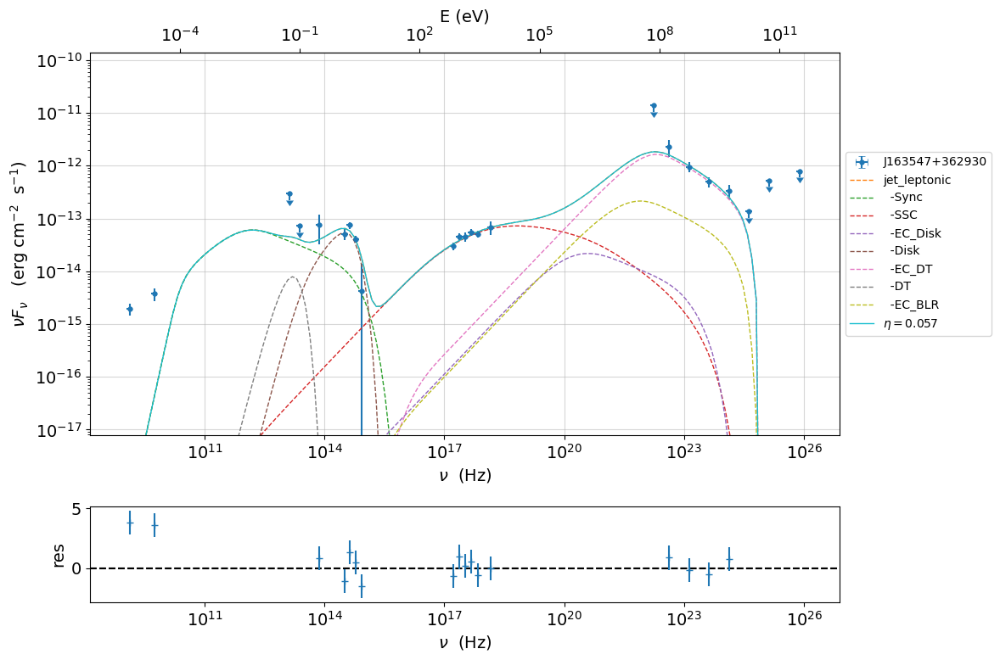

In [3]:
jet_5=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_3.pkl")

jet_5.set_par('accr_eff',val=0.057)
jet_5.set_par('L_Disk',val=L_Disk*0.7)
jet_5.set_par('R_H',val=R_H*0.8)
jet_5.set_par('B',val=B*1.2)

jet_5.eval()
jet_5.show_model()

p=jet_5.plot_model(sed_data=sed_data)
plt.show()

fit_model_5=FitModel(jet=jet_5, name=r'$\eta = 0.057$',template=None)

fit_model_5.free('jet_leptonic','R_H')
#fit_model_5.freeze('jet_leptonic','B')
fit_model_5.freeze('jet_leptonic','theta')
fit_model_5.freeze('jet_leptonic','theta_open')
#fit_model_5.freeze('jet_leptonic','BulkFactor')
fit_model_5.freeze('jet_leptonic','z_cosm')
fit_model_5.freeze('jet_leptonic','gmin')
fit_model_5.freeze('jet_leptonic','gmax')
#fit_model_5.freeze('jet_leptonic','N')
#fit_model_5.freeze('jet_leptonic','gamma_break')
#fit_model_5.freeze('jet_leptonic','p')
#fit_model_5.freeze('jet_leptonic','p_1')
fit_model_5.freeze('jet_leptonic','R_inner_Sw')
fit_model_5.freeze('jet_leptonic','R_ext_Sw')
fit_model_5.freeze('jet_leptonic','accr_eff')
#fit_model_5.freeze('jet_leptonic','M_BH')
fit_model_5.freeze('jet_leptonic','T_DT')
#fit_model_5.freeze('jet_leptonic','L_Disk')
fit_model_5.freeze('jet_leptonic','tau_BLR')
fit_model_5.freeze('jet_leptonic','tau_DT')

#fit_model_5.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_5.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_5.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_5.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,2.00e+03]
fit_model_5.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_5.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_5.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_5.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_5.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_5.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_5.jet_leptonic.parameters.L_Disk.fit_range=[5.00e45,8.00e46]
fit_model_5.jet_leptonic.parameters.R_H.fit_range=[5.00e17,3.00e18]
fit_model_5.jet_leptonic.parameters.B.fit_range=[0.020,0.100]
fit_model_5.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_5.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_5,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.057$',repeat=3, use_UL=True)
fit_model_5.eval()
#fit_model_5.show_model()
#fit_model_5.jet_leptonic.energetic_report()
best_fit_minuit.save_report('Report_best_fit_model_5_3.pkl')
fit_model_5.save_model('fit_model_5_3.pkl')
model_minimizer_minuit.save_model('model_minimizer_5_3.pkl')
p2=fit_model_5.plot_model(sed_data=sed_data)
#p2.save('fit_model_5.png')
print(fit_model_5.jet_leptonic.get_beaming())

# $\eta=0.100$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False



--------------------------------------------------------------------------------
model description: 
--------------------------------------------------------------------------------
type: Jet
name: jet_leptonic  

electrons distribution:
 type: bkn  
 gamma energy grid size:  201
 gmin grid : 1.000000e+00
 gmax grid : 2.000000e+04
 normalization:  True
 log-values:  False
 ratio of cold protons to relativistic electrons: 1.000000e-01

accretion disk:
 disk Type: MultiBB
 L disk: 1.971123e+46 (erg/s)
 T disk: 3.043949e+04 (K)
 nu peak disk: 2.487457e+15 (Hz)
 Sw radius 3.257473e+14 (cm)
 L Edd. 1.838237e+47 (erg/s)
 accr_rate: 3.477330e+00 (M_sun/yr)
 accr_rate Edd.: 3.242901e+01 (M_sun/yr)

radiative fields:
 seed photons grid size:  100
 IC emission grid size:  100
 source emissivity lower bound :  1.000000e-120
 spectral components:
   name:Sum, state: on
   name:Sync, state: self-abs
   name:SSC, state: on
   name:EC_Disk, state: on
   name:Disk, state: on
   name:EC_DT, state: on


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,1.000000e-01,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False


--------------------------------------------------------------------------------


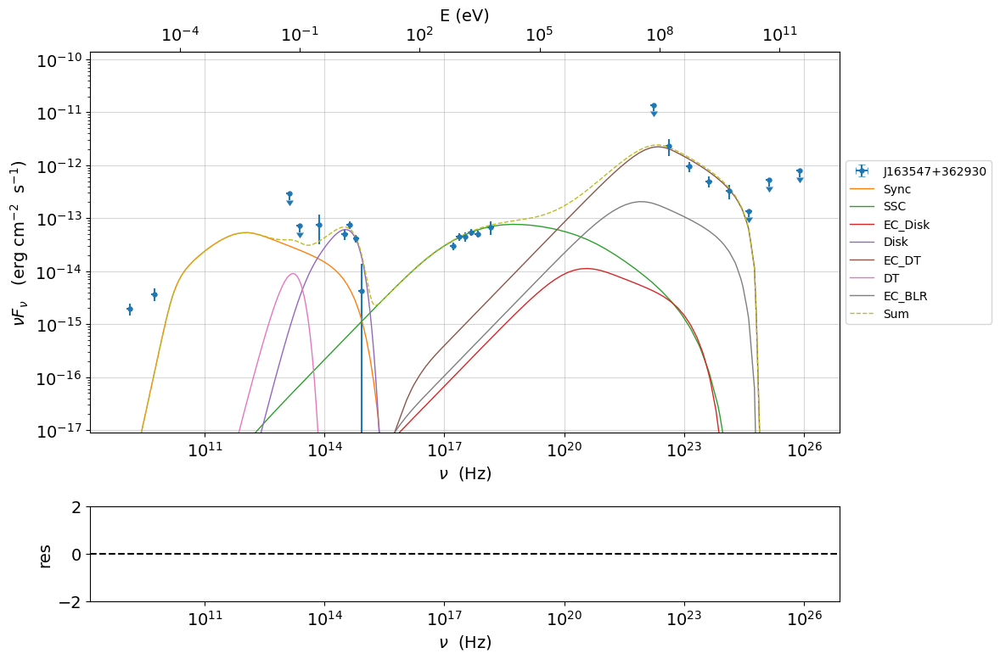

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 23

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.66855e+01

fit run: 1
- old chisq=3.66855e+01


0it [00:00, ?it/s]

- best chisq=3.66853e+01

fit run: 2
- old chisq=3.66853e+01


0it [00:00, ?it/s]

- best chisq=3.66571e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.100$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,7.699058e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.065102e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.410731e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.648568e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,1.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.238069e+09,0.000000e+00,--,False,False



converged=True
calls=986
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 36.66                      │              Nfcn = 986              │
│ EDM = 0.113 (Goal: 0.0002)       │           time = 305.2 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │    770    │    60     │            │            │   100   │  2000   │       │
│ 1 │ par_1 │  1.07e3   │  0.07e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.411   │   0.019   │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │    3.6    │    0.7    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │   1.2e9   │   0.9e9   │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │ 19.91e45  │  0.01e45  │            │            │  5e+45  │  8e+46  │       │
│ 6 │ par_6 │1.80023e18 │0.00010e18 │            │            │  5e+17  │  3e+18  │       │
│ 7 │ par_7 │   0.040   │   0.014   │            │            │  0.02   │   0.1   │       │
│ 8 │ par_8 │   15.7    │    1.3    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  3.93e+03      38.7    -0.168      15.5 -3.12e+11  2.36e+44  2.95e+15    -0.554      24.1 │
│ par_1 │      38.7  5.29e+03   -0.0707      12.9 -2.22e+11  1.38e+44  1.94e+15    -0.395     0.324 │
│ par_2 │    -0.168   -0.0707  0.000374  -0.00557  1.12e+08 -8.36e+40 -1.05e+12  0.000193  -0.00874 │
│ par_3 │      15.5      12.9  -0.00557     0.216 -4.06e+09  3.14e+42  3.88e+13  -0.00639     0.434 │
│ par_4 │ -3.12e+11 -2.22e+11  1.12e+08 -4.06e+09  8.28e+19 -6.11e+52 -7.75e+23   1.3e+08 -7.43e+09 │
│ par_5 │  2.36e+44  1.38e+44 -8.36e+40  3.14e+42 -6.11e+52  1.09e+86  6.68e+56 -9.34e+40  3.88e+42 │
│ par_6 │  2.95e+15  1.94e+15 -1.05e+12  3.88e+13 -7.75e+23  6.68e+56  9.22e+27  -1.2e+12  6.09e+13 │
│ par_7 │    -0.554    -0.395  0.000193  -0.00639   1.3e+08 -9.34e+40  -1.2e+12  0.000213    -0.011 │
│ par_8 │      24.1     0.324  -0.00874     0.434 -7.43e+09  3.88e+42  6.09e+13    -0.011      1.82 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=14
chisq=36.657055, chisq/red=2.618361 null hypothesis sig=0.000831

stats without the UL
dof  UL=8
chisq=36.635540, chisq/red=4.579443 null hypothesis sig=0.000013


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,7.699058e+02,7.699058e+02,6.267784e+01,--,9.214208e+02,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.065102e+03,1.065102e+03,7.265279e+01,--,9.463835e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.410731e+00,1.410731e+00,1.875864e-02,--,1.446258e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.648568e+00,3.648568e+00,6.693376e-01,--,3.576325e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,9.274387e+00,--,--,--,9.274387e+00,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.411660e+02,--,--,--,8.411660e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,1.000000e-01,--,--,--,1.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.238069e+09,1.238069e+09,9.063867e+08,--,1.102905e+09,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


18.736343933473115


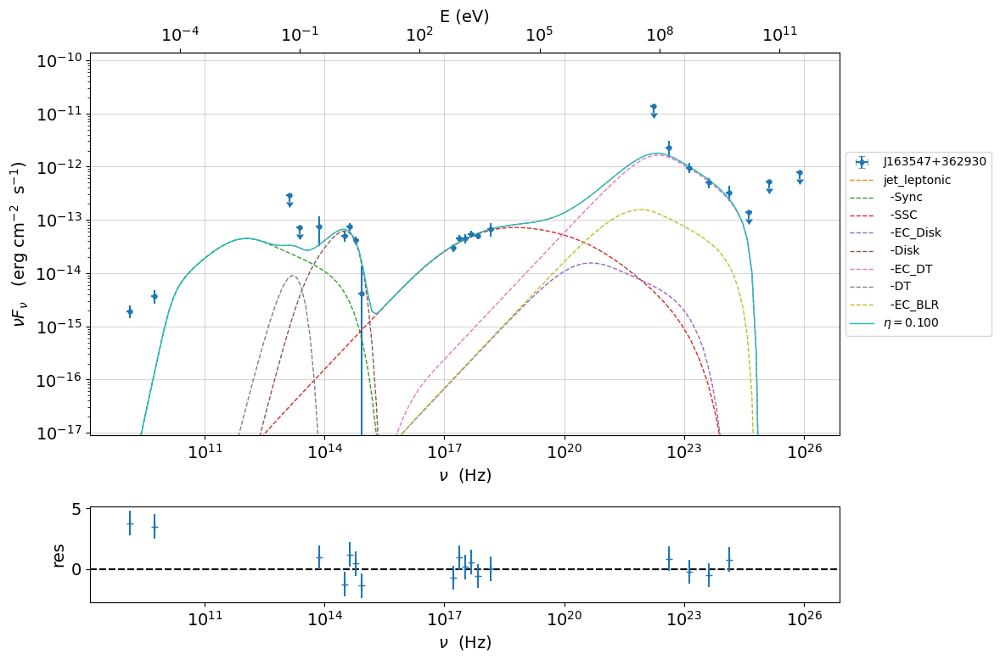

In [4]:
jet_1=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_3.pkl")

jet_1.set_par('accr_eff',val=0.100)
jet_1.set_par('L_Disk',val=L_Disk*1.4)
jet_1.set_par('R_H',val=R_H*1.2)
jet_1.set_par('B',val=B*0.7)

jet_1.eval()
jet_1.show_model()

p=jet_1.plot_model(sed_data=sed_data)
plt.show()

fit_model_1=FitModel(jet=jet_1, name=r'$\eta = 0.100$',template=None)

fit_model_1.free('jet_leptonic','R_H')
#fit_model_1.freeze('jet_leptonic','B')
fit_model_1.freeze('jet_leptonic','theta')
fit_model_1.freeze('jet_leptonic','theta_open')
#fit_model_1.freeze('jet_leptonic','BulkFactor')
fit_model_1.freeze('jet_leptonic','z_cosm')
fit_model_1.freeze('jet_leptonic','gmin')
fit_model_1.freeze('jet_leptonic','gmax')
#fit_model_1.freeze('jet_leptonic','N')
#fit_model_1.freeze('jet_leptonic','gamma_break')
#fit_model_1.freeze('jet_leptonic','p')
#fit_model_1.freeze('jet_leptonic','p_1')
fit_model_1.freeze('jet_leptonic','R_inner_Sw')
fit_model_1.freeze('jet_leptonic','R_ext_Sw')
fit_model_1.freeze('jet_leptonic','accr_eff')
#fit_model_1.freeze('jet_leptonic','M_BH')
fit_model_1.freeze('jet_leptonic','T_DT')
#fit_model_1.freeze('jet_leptonic','L_Disk')
fit_model_1.freeze('jet_leptonic','tau_BLR')
fit_model_1.freeze('jet_leptonic','tau_DT')

#fit_model_1.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_1.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_1.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_1.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_1.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_1.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_1.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_1.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_1.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_1.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_1.jet_leptonic.parameters.L_Disk.fit_range=[5.00e45,8.00e46]
fit_model_1.jet_leptonic.parameters.R_H.fit_range=[5.00e17,3.00e18]
fit_model_1.jet_leptonic.parameters.B.fit_range=[0.020,0.100]
fit_model_1.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_1.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_1,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.100$',repeat=3, use_UL=True)
fit_model_1.eval()
best_fit_minuit.save_report('Report_best_fit_model_1_3.pkl')
fit_model_1.save_model('fit_model_1_3.pkl')
model_minimizer_minuit.save_model('model_minimizer_1_3.pkl')
#fit_model_1.show_model()
#fit_model_1.jet_leptonic.energetic_report()
p2=fit_model_1.plot_model(sed_data=sed_data)
#p2.save('fit_model_1.png')
print(fit_model_1.jet_leptonic.get_beaming())

# $\eta=0.150$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False


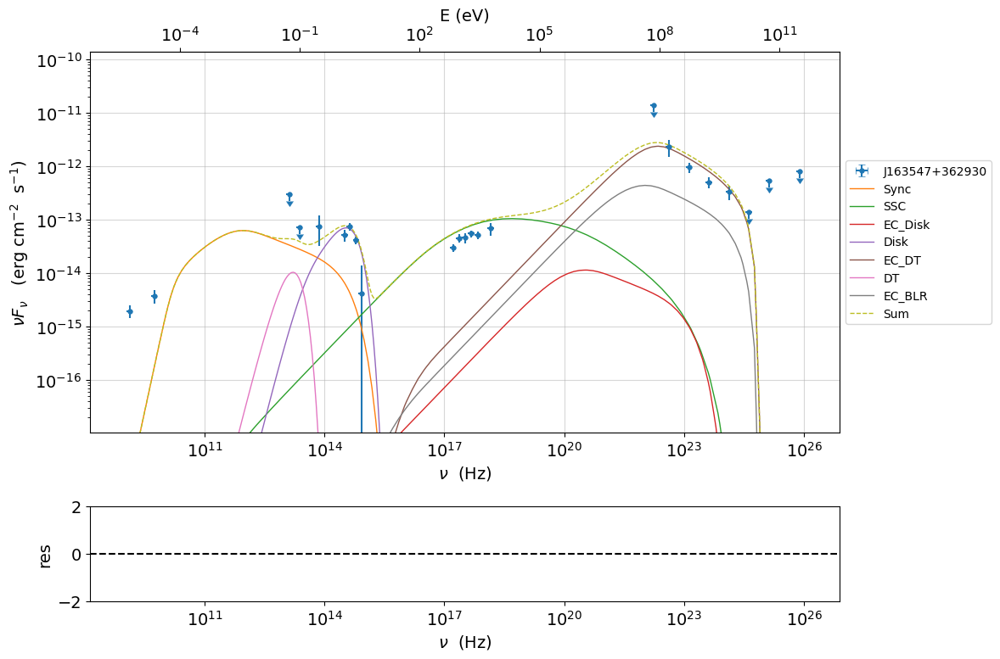

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 23

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.64595e+01

fit run: 1
- old chisq=3.64595e+01


0it [00:00, ?it/s]

- best chisq=3.64500e+01

fit run: 2
- old chisq=3.64500e+01


0it [00:00, ?it/s]

- best chisq=3.63595e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.150$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,9.013735e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.243690e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.409303e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.676444e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,1.500000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.455790e+09,0.000000e+00,--,False,False



converged=True
calls=922
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 36.36                      │              Nfcn = 922              │
│ EDM = 4.76 (Goal: 0.0002)        │           time = 286.3 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │   0.9e3   │   0.4e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │   1.2e3   │   0.4e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.41    │   0.13    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │    3.7    │    0.6    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.456e9  │  0.006e9  │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │33.72705e45│0.00006e45 │            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │2.10276e18 │0.00006e18 │            │            │  1e+18  │  3e+18  │       │
│ 7 │ par_7 │   0.022   │   0.009   │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │   13.2    │    1.9    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  1.86e+05 -1.47e+04      17.4     -13.7 -3.53e+07  1.96e+40 -4.51e+12     -2.51      -387 │
│ par_1 │ -1.47e+04  1.42e+05      2.71      82.1 -3.71e+07 -8.68e+41 -2.23e+14     -1.12      -373 │
│ par_2 │      17.4      2.71   0.00466   0.00043       146 -3.38e+36 -8.15e+08  1.09e-05 -0.000169 │
│ par_3 │     -13.7      82.1   0.00043    0.0982 -1.84e+03  4.74e+38  1.12e+11  -0.00066   0.00607 │
│ par_4 │ -3.53e+07 -3.71e+07       146 -1.84e+03  3.05e+13 -2.12e+43  1.55e+15  1.26e+03  3.68e+05 │
│ par_5 │  1.96e+40 -8.68e+41 -3.38e+36  4.74e+38 -2.12e+43  4.19e+81 -6.53e+53  1.71e+37 -3.56e+38 │
│ par_6 │ -4.51e+12 -2.23e+14 -8.15e+08  1.12e+11  1.55e+15 -6.53e+53  3.16e+27  4.45e+09 -1.27e+10 │
│ par_7 │     -2.51     -1.12  1.09e-05  -0.00066  1.26e+03  1.71e+37  4.45e+09  7.51e-05    0.0133 │
│ par_8 │      -387      -373 -0.000169   0.00607  3.68e+05 -3.56e+38 -1.27e+10    0.0133      3.91 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=14
chisq=36.359549, chisq/red=2.597111 null hypothesis sig=0.000922

stats without the UL
dof  UL=8
chisq=36.353735, chisq/red=4.544217 null hypothesis sig=0.000015


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,9.013735e+02,9.013735e+02,4.163378e+02,--,9.214208e+02,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.243690e+03,1.243690e+03,3.701536e+02,--,9.463835e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.409303e+00,1.409303e+00,1.266051e-01,--,1.446258e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.676444e+00,3.676444e+00,6.013554e-01,--,3.576325e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,9.274387e+00,--,--,--,9.274387e+00,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.411660e+02,--,--,--,8.411660e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,1.500000e-01,--,--,--,1.500000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.455790e+09,1.455790e+09,5.526003e+06,--,1.102905e+09,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


17.845275521649754


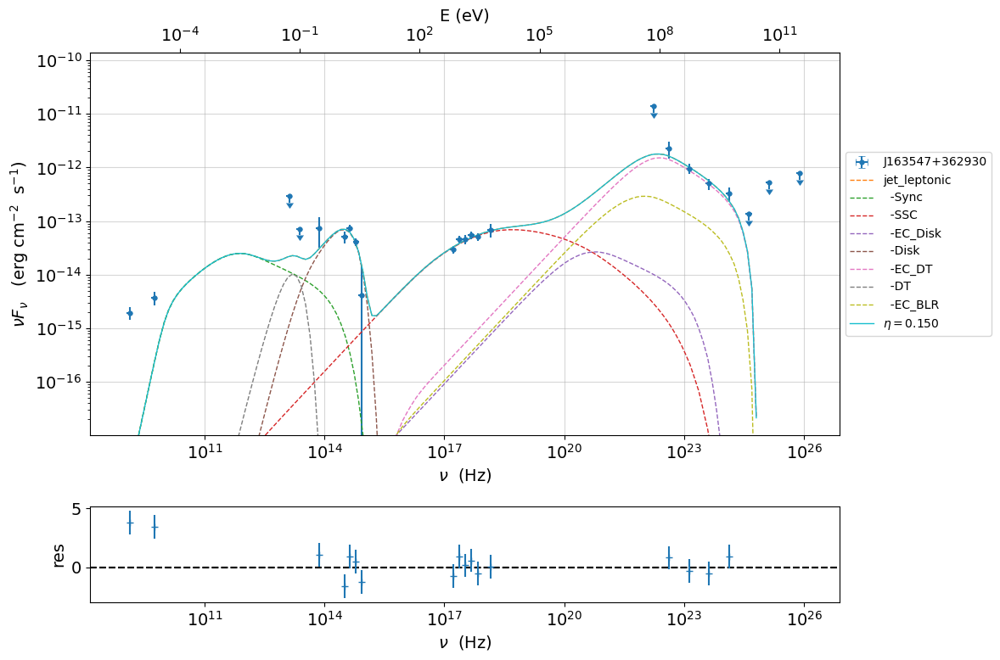

In [5]:
jet_1_5=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_3.pkl")

jet_1_5.set_par('accr_eff',val=0.150)
jet_1_5.set_par('L_Disk',val=L_Disk*2.4)
jet_1_5.set_par('R_H',val=R_H*1.4)
jet_1_5.set_par('B',val=B*0.6)

jet_1_5.eval()
#jet_1_5.show_model()

p=jet_1_5.plot_model(sed_data=sed_data)
plt.show()
#print(js)

fit_model_1_5=FitModel(jet=jet_1_5, name=r'$\eta = 0.150$',template=None)

fit_model_1_5.free('jet_leptonic','R_H')
fit_model_1_5.free('jet_leptonic','BulkFactor')
#fit_model_1_5.freeze('jet_leptonic','B')
fit_model_1_5.freeze('jet_leptonic','theta')
fit_model_1_5.freeze('jet_leptonic','theta_open')
#fit_model_1_5.freeze('jet_leptonic','BulkFactor')
fit_model_1_5.freeze('jet_leptonic','z_cosm')
fit_model_1_5.freeze('jet_leptonic','gmin')
fit_model_1_5.freeze('jet_leptonic','gmax')
#fit_model_1_5.freeze('jet_leptonic','N')
#fit_model_1_5.freeze('jet_leptonic','gamma_break')
#fit_model_1_5.freeze('jet_leptonic','p')
#fit_model_1_5.freeze('jet_leptonic','p_1')
fit_model_1_5.freeze('jet_leptonic','R_inner_Sw')
fit_model_1_5.freeze('jet_leptonic','R_ext_Sw')
fit_model_1_5.freeze('jet_leptonic','accr_eff')
#fit_model_1_5.freeze('jet_leptonic','M_BH')
fit_model_1_5.freeze('jet_leptonic','T_DT')
#fit_model_1_5.freeze('jet_leptonic','L_Disk')
fit_model_1_5.freeze('jet_leptonic','tau_BLR')
fit_model_1_5.freeze('jet_leptonic','tau_DT')

#fit_model_1_5.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_1_5.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_1_5.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_1_5.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_1_5.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_1_5.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_1_5.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_1_5.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_1_5.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_1_5.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_1_5.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_1_5.jet_leptonic.parameters.R_H.fit_range=[1.00e18,3.00e18]
fit_model_1_5.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_1_5.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_1_5.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_1_5,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.150$',repeat=3, use_UL=True)
fit_model_1_5.eval()
best_fit_minuit.save_report('Report_best_fit_model_1_5_3.pkl')
fit_model_1_5.save_model('fit_model_1_5_3.pkl')
model_minimizer_minuit.save_model('model_minimizer_1_5_3.pkl')
#fit_model_1_5.show_model()
#fit_model_1_5.jet_leptonic.energetic_report()
p2=fit_model_1_5.plot_model(sed_data=sed_data)
#p2.save('fit_model_1_5.png')
print(fit_model_1_5.jet_leptonic.get_beaming())

# $\eta=0.200$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False


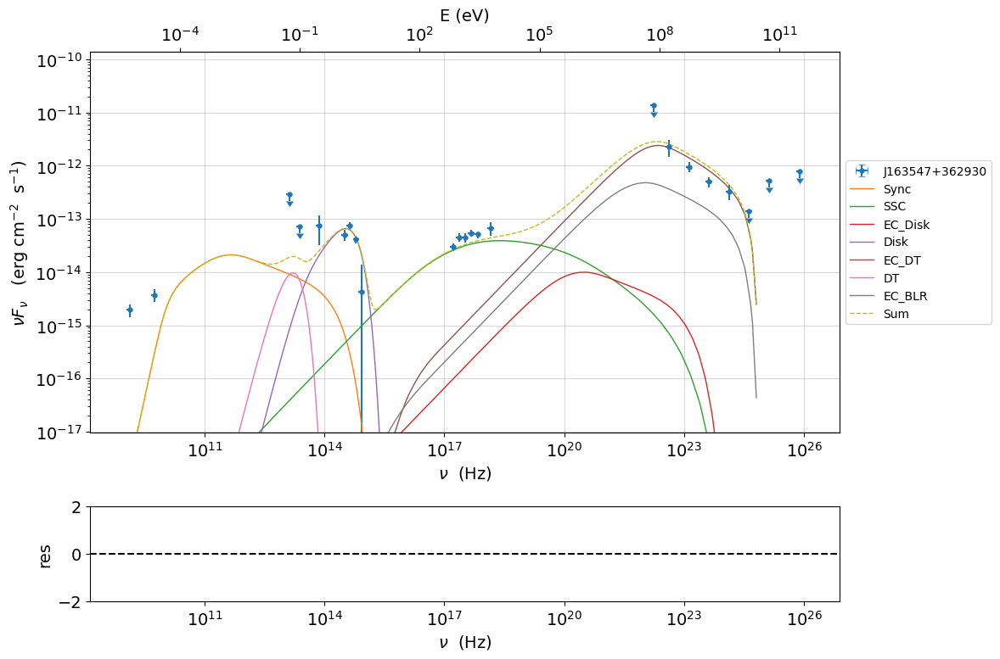

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 23

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.58792e+01

fit run: 1
- old chisq=3.58792e+01


0it [00:00, ?it/s]

- best chisq=3.58786e+01

fit run: 2
- old chisq=3.58786e+01


0it [00:00, ?it/s]

- best chisq=3.58785e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.200$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,8.165674e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.279536e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.413925e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.662788e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,2.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.300787e+09,0.000000e+00,--,False,False



converged=True
calls=387
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 35.88                      │              Nfcn = 387              │
│ EDM = 9.91 (Goal: 0.0002)        │           time = 125.7 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │   0.8e3   │   1.2e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │   1.3e3   │   1.6e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.41    │   0.12    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │    3.7    │    0.7    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.301e9  │  0.023e9  │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │42.238547e45│0.000014e45│            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │2.32523e18 │0.00017e18 │            │            │  1e+18  │  4e+18  │       │
│ 7 │ par_7 │   0.02    │   0.06    │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │    13     │    11     │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  3.77e+06  3.46e+06      32.1       476 -1.69e+08 -6.39e+41 -3.56e+15      -117 -3.45e+04 │
│ par_1 │  3.46e+06  3.57e+06      13.3       535 -2.88e+07 -6.66e+41 -3.74e+15      -113 -3.39e+04 │
│ par_2 │      32.1      13.3    0.0068    0.0015  3.81e+03  8.56e+35  7.14e+09 -0.000277   -0.0907 │
│ par_3 │       476       535    0.0015     0.174 -1.66e+04 -6.03e+36  2.13e+10   -0.0161     -4.46 │
│ par_4 │ -1.69e+08 -2.88e+07  3.81e+03 -1.66e+04  5.14e+14  2.97e+43   1.4e+17  5.49e+03   9.2e+05 │
│ par_5 │ -6.39e+41 -6.66e+41  8.56e+35 -6.03e+36  2.97e+43  2.05e+80  7.17e+53  2.48e+37   3.1e+39 │
│ par_6 │ -3.56e+15 -3.74e+15  7.14e+09  2.13e+10   1.4e+17  7.17e+53  3.02e+28  1.41e+11  1.43e+13 │
│ par_7 │      -117      -113 -0.000277   -0.0161  5.49e+03  2.48e+37  1.41e+11   0.00376      1.11 │
│ par_8 │ -3.45e+04 -3.39e+04   -0.0907     -4.46   9.2e+05   3.1e+39  1.43e+13      1.11       332 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=14
chisq=35.878514, chisq/red=2.562751 null hypothesis sig=0.001088

stats without the UL
dof  UL=8
chisq=35.873771, chisq/red=4.484221 null hypothesis sig=0.000019


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,8.165674e+02,8.165674e+02,1.168735e+03,--,9.214208e+02,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.279536e+03,1.279536e+03,1.578588e+03,--,9.463835e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.413925e+00,1.413925e+00,1.197136e-01,--,1.446258e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.662788e+00,3.662788e+00,6.547635e-01,--,3.576325e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,9.274387e+00,--,--,--,9.274387e+00,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.411660e+02,--,--,--,8.411660e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,2.000000e-01,--,--,--,2.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.300787e+09,1.300787e+09,2.265916e+07,--,1.102905e+09,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


17.871647718223812


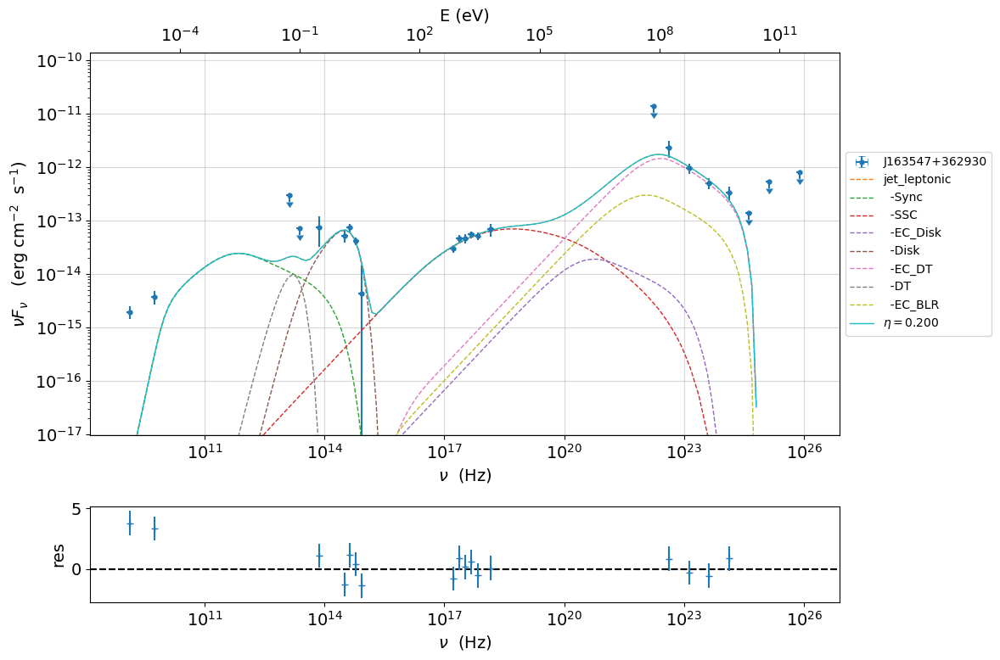

In [6]:
jet_2=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_3.pkl")

jet_2.set_par('accr_eff',val=0.200)
jet_2.set_par('L_Disk',val=L_Disk*3.)
jet_2.set_par('R_H',val=R_H*1.55)
jet_2.set_par('B',val=B*0.30)

jet_2.eval()
#jet_2.show_model()

p=jet_2.plot_model(sed_data=sed_data)
plt.show()
#print(js)

fit_model_2=FitModel(jet=jet_2, name=r'$\eta = 0.200$',template=None)

fit_model_2.free('jet_leptonic','R_H')
#fit_model_2.freeze('jet_leptonic','B')
fit_model_2.freeze('jet_leptonic','theta')
fit_model_2.freeze('jet_leptonic','theta_open')
#fit_model_2.freeze('jet_leptonic','BulkFactor')
fit_model_2.freeze('jet_leptonic','z_cosm')
fit_model_2.freeze('jet_leptonic','gmin')
fit_model_2.freeze('jet_leptonic','gmax')
#fit_model_2.freeze('jet_leptonic','N')
#fit_model_2.freeze('jet_leptonic','gamma_break')
#fit_model_2.freeze('jet_leptonic','p')
#fit_model_2.freeze('jet_leptonic','p_1')
fit_model_2.freeze('jet_leptonic','R_inner_Sw')
fit_model_2.freeze('jet_leptonic','R_ext_Sw')
fit_model_2.freeze('jet_leptonic','accr_eff')
#fit_model_2.freeze('jet_leptonic','M_BH')
fit_model_2.freeze('jet_leptonic','T_DT')
#fit_model_2.freeze('jet_leptonic','L_Disk')
fit_model_2.freeze('jet_leptonic','tau_BLR')
fit_model_2.freeze('jet_leptonic','tau_DT')

#fit_model_2.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_2.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_2.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_2.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_2.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_2.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_2.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_2.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_2.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_2.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_2.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_2.jet_leptonic.parameters.R_H.fit_range=[1.00e18,4.00e18]
fit_model_2.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_2.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_2.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_2,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.200$',repeat=3, use_UL=True)
fit_model_2.eval()
best_fit_minuit.save_report('Report_best_fit_model_2_3.pkl')
fit_model_2.save_model('fit_model_2_3.pkl')
model_minimizer_minuit.save_model('model_minimizer_2_3.pkl')
#fit_model_2.show_model()
#fit_model_2.jet_leptonic.energetic_report()
p2=fit_model_2.plot_model(sed_data=sed_data)
#p2.save('fit_model_2.png')
print(fit_model_2.jet_leptonic.get_beaming())

# $\eta=0.300$

==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,False
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,False
jet_leptonic,N,emitters_density,1 / cm3,9.214208e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,9.463835e+02,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.446258e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.576325e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,False
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,False
jet_leptonic,accr_eff,Disk,,8.300000e-02,0.000000e+00,--,False,False
jet_leptonic,M_BH,Disk,M_sun*,1.102905e+09,0.000000e+00,--,False,False


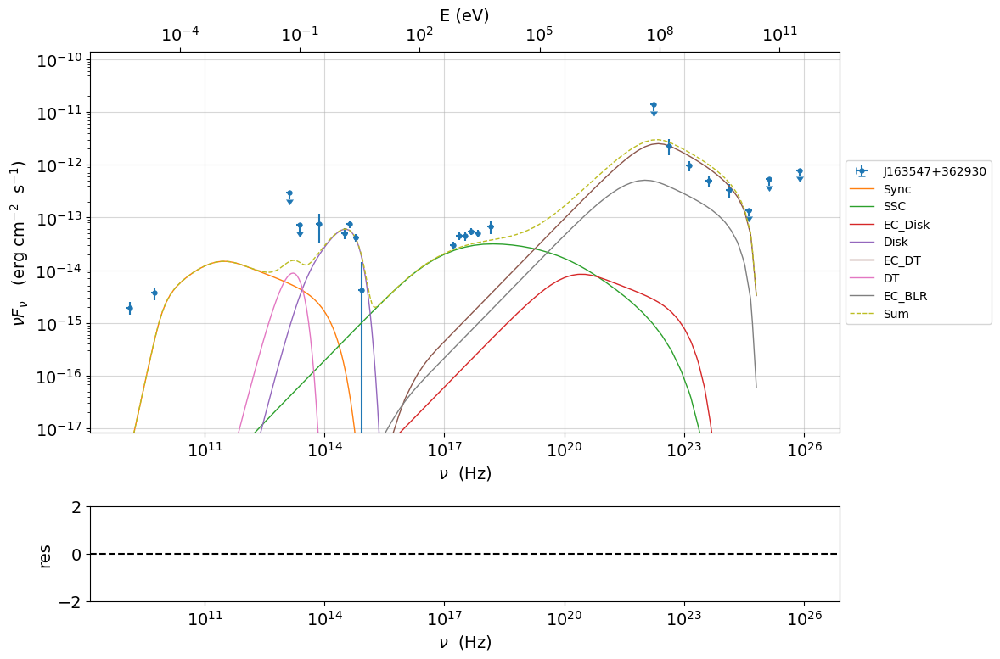

filtering data in fit range = [1.000000e+08,1.000000e+30]
data length 23

*** start fit process ***
----- 
fit run: 0


0it [00:00, ?it/s]

- best chisq=3.55678e+01

fit run: 1
- old chisq=3.55678e+01


0it [00:00, ?it/s]

- best chisq=3.55665e+01

fit run: 2
- old chisq=3.55665e+01


0it [00:00, ?it/s]

- best chisq=3.55661e+01

-------------------------------------------------------------------------
Fit report

Model: $\eta = 0.300$


model name,name,par type,units,val,phys. bound. min,phys. bound. max,log,frozen
jet_leptonic,gmin,low-energy-cut-off,lorentz-factor*,1.000000e+00,1.000000e+00,1.000000e+09,False,True
jet_leptonic,gmax,high-energy-cut-off,lorentz-factor*,2.000000e+04,1.000000e+00,1.000000e+15,False,True
jet_leptonic,N,emitters_density,1 / cm3,6.030497e+02,0.000000e+00,--,False,False
jet_leptonic,gamma_break,turn-over-energy,lorentz-factor*,1.228689e+03,1.000000e+00,1.000000e+09,False,False
jet_leptonic,p,LE_spectral_slope,,1.451240e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,p_1,HE_spectral_slope,,3.628523e+00,-1.000000e+01,1.000000e+01,False,False
jet_leptonic,R_inner_Sw,Disk,Sw. radii*,9.274387e+00,0.000000e+00,--,False,True
jet_leptonic,R_ext_Sw,Disk,Sw. radii*,8.411660e+02,0.000000e+00,--,False,True
jet_leptonic,accr_eff,Disk,,3.000000e-01,0.000000e+00,--,False,True
jet_leptonic,M_BH,Disk,M_sun*,1.148847e+09,0.000000e+00,--,False,False



converged=True
calls=422
mesg=


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 35.57                      │              Nfcn = 422              │
│ EDM = 0.223 (Goal: 0.0002)       │           time = 135.8 sec           │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │       SOME Parameters at limit       │
├──────────────────────────────────┼──────────────────────────────────────┤
│ ABOVE EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ par_0 │  0.60e3   │  0.15e3   │            │            │   100   │  2000   │       │
│ 1 │ par_1 │  1.23e3   │  0.32e3   │            │            │   500   │  3000   │       │
│ 2 │ par_2 │   1.45    │   0.05    │            │            │   1.4   │   1.6   │       │
│ 3 │ par_3 │    3.6    │    0.6    │            │            │    3    │   3.8   │       │
│ 4 │ par_4 │  1.15e9   │  0.17e9   │            │            │  5e+08  │  2e+09  │       │
│ 5 │ par_5 │ 57.75e45  │  0.14e45  │            │            │  8e+45  │  8e+46  │       │
│ 6 │ par_6 │ 2.7011e18 │ 0.0011e18 │            │            │  1e+18  │  4e+18  │       │
│ 7 │ par_7 │   0.022   │   0.009   │            │            │  0.01   │   0.1   │       │
│ 8 │ par_8 │   15.2    │    2.2    │            │            │   10    │   25    │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───────┬───────────────────────────────────────────────────────────────────────────────────────────┐
│       │     par_0     par_1     par_2     par_3     par_4     par_5     par_6     par_7     par_8 │
├───────┼───────────────────────────────────────────────────────────────────────────────────────────┤
│ par_0 │  2.26e+04 -2.72e+03      2.48      2.94  -4.4e+09  1.23e+45   9.5e+15    -0.531      -121 │
│ par_1 │ -2.72e+03  1.05e+05      1.44       -39 -4.49e+09 -2.95e+46 -2.29e+17     -1.72     -48.9 │
│ par_2 │      2.48      1.44   0.00264 -0.000711  1.45e+06 -1.87e+41 -1.43e+12  0.000168    0.0361 │
│ par_3 │      2.94       -39 -0.000711     0.188 -8.37e+06  5.13e+43  3.98e+14   0.00148    -0.286 │
│ par_4 │  -4.4e+09 -4.49e+09  1.45e+06 -8.37e+06  2.84e+16 -3.44e+51 -2.66e+22  3.09e+05  1.79e+08 │
│ par_5 │  1.23e+45 -2.95e+46 -1.87e+41  5.13e+43 -3.44e+51  2.03e+88  1.56e+59   7.5e+41 -1.32e+44 │
│ par_6 │   9.5e+15 -2.29e+17 -1.43e+12  3.98e+14 -2.66e+22  1.56e+59  1.24e+30  5.82e+12 -1.02e+15 │
│ par_7 │    -0.531     -1.72  0.000168   0.00148  3.09e+05   7.5e+41  5.82e+12  7.77e-05   0.00635 │
│ par_8 │      -121     -48.9    0.0361    -0.286  1.79e+08 -1.32e+44 -1.02e+15   0.00635      5.13 │
└───────┴───────────────────────────────────────────────────────────────────────────────────────────┘

dof=14
chisq=35.566063, chisq/red=2.540433 null hypothesis sig=0.001211

stats without the UL
dof  UL=8
chisq=35.556717, chisq/red=4.444590 null hypothesis sig=0.000021


best fit pars


model name,name,val,bestfit val,err +,err -,start val,fit range min,fit range max,frozen
jet_leptonic,gmin,1.000000e+00,--,--,--,1.000000e+00,1.000000e+00,1.000000e+09,True
jet_leptonic,gmax,2.000000e+04,--,--,--,2.000000e+04,1.000000e+00,1.000000e+15,True
jet_leptonic,N,6.030497e+02,6.030497e+02,1.495929e+02,--,9.214208e+02,1.000000e+02,2.000000e+03,False
jet_leptonic,gamma_break,1.228689e+03,1.228689e+03,3.195101e+02,--,9.463835e+02,5.000000e+02,3.000000e+03,False
jet_leptonic,p,1.451240e+00,1.451240e+00,4.848311e-02,--,1.446258e+00,1.400000e+00,1.600000e+00,False
jet_leptonic,p_1,3.628523e+00,3.628523e+00,6.452208e-01,--,3.576325e+00,3.000000e+00,3.800000e+00,False
jet_leptonic,R_inner_Sw,9.274387e+00,--,--,--,9.274387e+00,0.000000e+00,--,True
jet_leptonic,R_ext_Sw,8.411660e+02,--,--,--,8.411660e+02,0.000000e+00,--,True
jet_leptonic,accr_eff,3.000000e-01,--,--,--,3.000000e-01,0.000000e+00,--,True
jet_leptonic,M_BH,1.148847e+09,1.148847e+09,1.670029e+08,--,1.102905e+09,5.000000e+08,2.000000e+09,False


-------------------------------------------------------------------------


there are  fit warnings messages, use  the .show_fit_warnings() or access the member .minimizer._post_fit_warnings
18.616685910164176


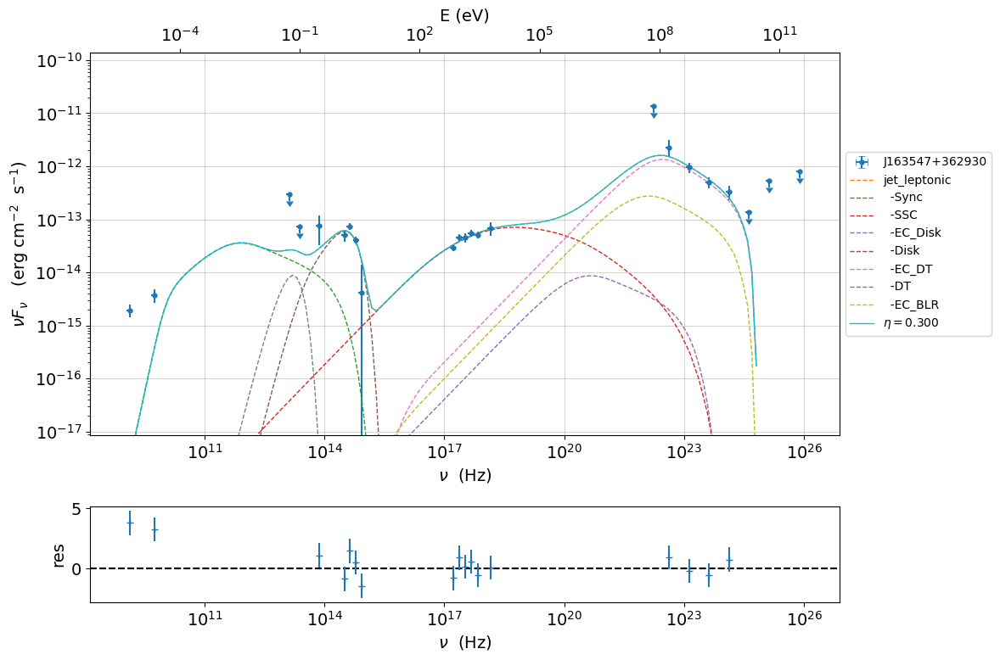

In [7]:
jet_3=Jet.load_model("/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/prefit_SSD_3.pkl")

jet_3.set_par('accr_eff',val=0.300)
jet_3.set_par('L_Disk',val=L_Disk*4.1)
jet_3.set_par('R_H',val=R_H*1.8)
jet_3.set_par('B',val=B*0.20)

jet_3.eval()
#jet_3.show_model()

p=jet_3.plot_model(sed_data=sed_data)
plt.show()

fit_model_3=FitModel(jet=jet_3, name=r'$\eta = 0.300$',template=None)

fit_model_3.free('jet_leptonic','R_H')
#fit_model_3.freeze('jet_leptonic','B')
fit_model_3.freeze('jet_leptonic','theta')
fit_model_3.freeze('jet_leptonic','theta_open')
#fit_model_3.freeze('jet_leptonic','BulkFactor')
fit_model_3.freeze('jet_leptonic','z_cosm')
fit_model_3.freeze('jet_leptonic','gmin')
fit_model_3.freeze('jet_leptonic','gmax')
#fit_model_3.freeze('jet_leptonic','N')
#fit_model_3.freeze('jet_leptonic','gamma_break')
#fit_model_3.freeze('jet_leptonic','p')
#fit_model_3.freeze('jet_leptonic','p_1')
fit_model_3.freeze('jet_leptonic','R_inner_Sw')
fit_model_3.freeze('jet_leptonic','R_ext_Sw')
fit_model_3.freeze('jet_leptonic','accr_eff')
#fit_model_3.freeze('jet_leptonic','M_BH')
fit_model_3.freeze('jet_leptonic','T_DT')
#fit_model_3.freeze('jet_leptonic','L_Disk')
fit_model_3.freeze('jet_leptonic','tau_BLR')
fit_model_3.freeze('jet_leptonic','tau_DT')

#fit_model_3.jet_leptonic.parameters.gmin.fit_range=[1.00e+00,2.0e+00]
#fit_model_3.jet_leptonic.parameters.gmax.fit_range=[1.00e+04,4.0e+04]
fit_model_3.jet_leptonic.parameters.N.fit_range=[1.00e+02,2.00e+03]
fit_model_3.jet_leptonic.parameters.gamma_break.fit_range=[5.00e+02,3.00e+03]
fit_model_3.jet_leptonic.parameters.p.fit_range=[1.40e+00,1.60e+00]
fit_model_3.jet_leptonic.parameters.p_1.fit_range=[3.00e+00,3.80e+00]
#fit_model_3.jet_leptonic.parameters.R_inner_Sw.fit_range=[5.0e+00,1.5e+01]
#fit_model_3.jet_leptonic.parameters.R_ext_Sw.fit_range=[1.000e+02,3.00e+02]
fit_model_3.jet_leptonic.parameters.M_BH.fit_range=[5.0000e+08,2.000e+9]
#fit_model_3.jet_leptonic.parameters.T_DT.fit_range=[4.00000e+02,8.000e+02]
fit_model_3.jet_leptonic.parameters.L_Disk.fit_range=[8.00e45,8.00e46]
fit_model_3.jet_leptonic.parameters.R_H.fit_range=[1.00e18,4.00e18]
fit_model_3.jet_leptonic.parameters.B.fit_range=[0.010,0.100]
fit_model_3.jet_leptonic.parameters.BulkFactor.fit_range=[10.00,25.00]


fit_model_3.eval()

model_minimizer_minuit=ModelMinimizer('minuit')
best_fit_minuit=model_minimizer_minuit.fit(fit_model_3,sed_data,10**8.,10**30.0,
                                           fitname=r'$\eta = 0.300$',repeat=3, use_UL=True)
fit_model_3.eval()
best_fit_minuit.save_report('Report_best_fit_model_3_3.pkl')
fit_model_3.save_model('fit_model_3_3.pkl')
model_minimizer_minuit.save_model('model_minimizer_3_3.pkl')
#fit_model_3.show_model()
#fit_model_3.jet_leptonic.energetic_report()
p2=fit_model_3.plot_model(sed_data=sed_data)
#p2.save('fit_model_3.png')
print(fit_model_3.jet_leptonic.get_beaming())

# Comparing the models

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5

Beaming factor values:
η = 0.057 --> 19.087698540694774
η = 0.083 --> 19.10719166034305
η = 0.100 --> 18.736343019211244
η = 0.150 --> 17.845273871533973
η = 0.200 --> 17.871649150602696
η = 0.300 --> 18.616687265677633


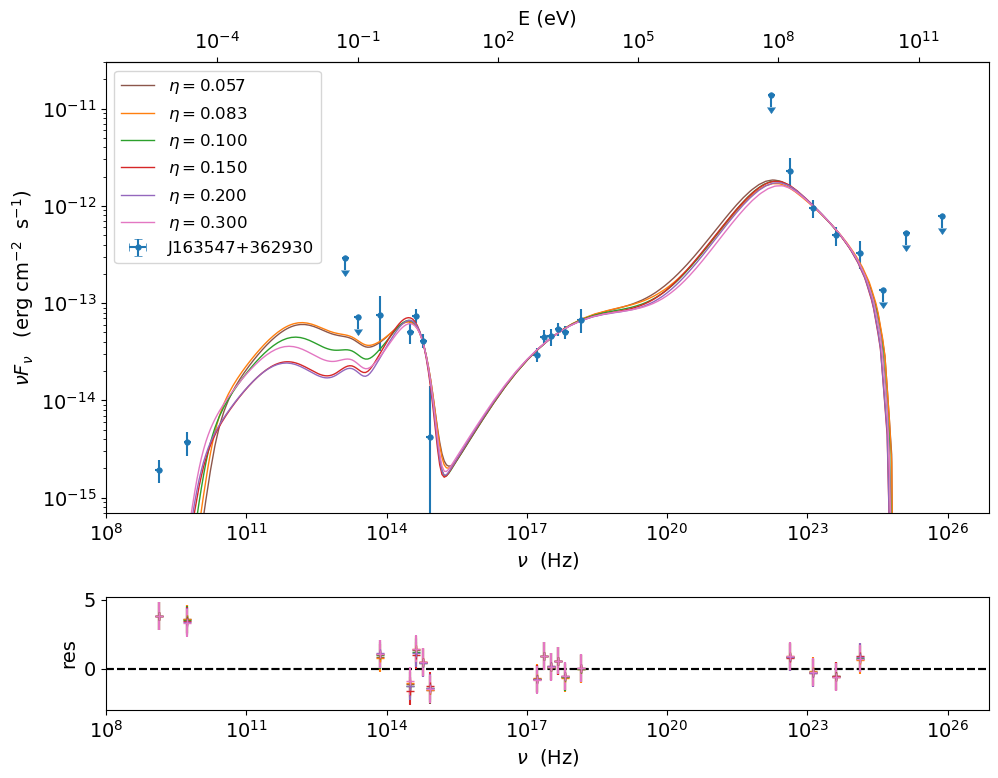

In [76]:
sed_data=ObsData.load('J163547_data.pkl')
jet=Jet(name='jet_leptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
jet.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
jet.add_user_par(name='theta_open',val=3,units='deg')
jet.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
jet.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
jet.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
jet.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

gmin=1
gmax=20000
N5=1148.063
gamma_break=882.9551
p=1.416318
p_1=3.609625
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.057
M_BH5=1147953000
T_DT=926.8273
R_DT=1.985557E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=2.978336E+017
R_BLR_out=3.276169E+017
L_Disk5=9.856093E+045
R=6.288935e+16
R_H5=1.2E+018
B5=0.07948746
NH_cold_to_rel_e=0.1
theta=3
BulkFactor5=19.99243
z_cosm=3.647763
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N5)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH5)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk5)
jet.set_par('R_H',val=R_H5)
jet.set_par('B',val=B5)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor5)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print("\nBeaming factor values:")
print('\u03B7 = 0.057 -->',jet.get_beaming())
my_plot=jet.plot_model(label=r'$\eta = 0.057$',comp='Sum', frame="obs", sed_data=sed_data, color='#8c564b')
my_plot.add_residual_plot(jet,sed_data,color='#8c564b')

gmin=1
gmax=20000
N8=921.4208
gamma_break=946.3835
p=1.446258
p_1=3.576325
T_DT=926.8273
R_DT=2.373137E+019
tau_DT=0.1
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.083
M_BH8=1102905000
tau_BLR=0.1
R_BLR_in=3.559706E+017
R_BLR_out=3.915677E+017
L_Disk8=1.407945E+046
R=7.861166E+016
R_H8=1.5E+018
B8=0.06558658
NH_cold_to_rel_e=0.1
theta=3
BulkFactor8=19.03681
z_cosm=3.647763
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N8)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH8)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk8)
jet.set_par('R_H',val=R_H8)
jet.set_par('B',val=B8)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor8)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.083 -->',jet.get_beaming())
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.083$',comp='Sum', frame="obs",color='#ff7f0e')
my_plot.add_residual_plot(jet,sed_data, color='#ff7f0e')

gmin=1
gmax=20000
N1=769.9058
gamma_break=1065.102
p=1.410731
p_1=3.648568
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.1
M_BH1=1238069000
T_DT=926.8273
R_DT=2.822024E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=4.233036E+017
R_BLR_out=4.656339E+017
L_Disk1=1.990955E+046
R=9.434627E+016
R_H1=1.800234E+018
B1=0.04047604
NH_cold_to_rel_e=0.1
theta=3
BulkFactor1=15.6698
z_cosm=3.647763
theta_open=3


jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N1)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH1)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk1)
jet.set_par('R_H',val=R_H1)
jet.set_par('B',val=B1)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor1)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.100 -->',jet.get_beaming())
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.100$',comp='Sum', frame="obs",color='#2ca02c')
my_plot.add_residual_plot(jet,sed_data,color='#2ca02c')


gmin=1
gmax=20000
N15=901.3735
gamma_break=1243.69
p=1.409303
p_1=3.676444
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.15
M_BH15=1455790000
T_DT=926.8273
R_DT=3.672985E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=5.509478E+017
R_BLR_out=6.060426E+017
L_Disk15=3.372705E+046
R=1.10201E+017
R_H15=2.102759E+018
B15=0.02164112
NH_cold_to_rel_e=0.1
theta=3
BulkFactor15=13.15663
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N15)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH15)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk15)
jet.set_par('R_H',val=R_H15)
jet.set_par('B',val=B15)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor15)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.150 -->',jet.get_beaming())
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.150$',comp='Sum', frame="obs",color='#d62728')
my_plot.add_residual_plot(jet,sed_data, color='#d62728')

gmin=1
gmax=20000
N2=816.5674
gamma_break=1279.536
p=1.413925
p_1=3.662788
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.2
M_BH2=1300787000
T_DT=926.8273
R_DT=4.110404E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=6.165606E+017
R_BLR_out=6.782166E+017
L_Disk2=4.223855E+046
R=1.218604E+017
R_H2=2.325235E+018
B2=0.01895942
NH_cold_to_rel_e=0.1
theta=3
BulkFactor2=13.21123
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N2)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH2)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk2)
jet.set_par('R_H',val=R_H2)
jet.set_par('B',val=B2)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor2)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.200 -->',jet.get_beaming())
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.200$',comp='Sum', frame="obs",color='#9467bd')
my_plot.add_residual_plot(jet,sed_data,color='#9467bd')

gmin=1
gmax=20000
N3=603.0497
gamma_break=1228.689
p=1.45124
p_1=3.628523
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.3
M_BH3=1148847000
T_DT=926.8273
R_DT=4.806335E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=7.209503E+017
R_BLR_out=7.930453E+017
L_Disk3=5.775215E+046
R=1.415606E+017
R_H3=2.701138E+018
B3=0.02232972
NH_cold_to_rel_e=0.1
theta=3
BulkFactor3=15.20138
z_cosm=3.647763
theta_open=3

jet.set_par('gmin',val=gmin)
jet.set_par('gmax',val=gmax)
jet.set_par('N',val=N3)
jet.set_par('gamma_break',val=gamma_break)
jet.set_par('p',val=p)
jet.set_par('p_1',val=p_1)
jet.set_par('R_inner_Sw',val=R_inner_Sw)
jet.set_par('R_ext_Sw',val=R_ext_Sw)
jet.set_par('accr_eff',val=accr_eff)
jet.set_par('M_BH',val=M_BH3)
jet.set_par('T_DT',val=T_DT)
jet.set_par('tau_DT',val=tau_DT)
jet.set_par('tau_BLR',val=tau_BLR)
jet.set_par('L_Disk',val=L_Disk3)
jet.set_par('R_H',val=R_H3)
jet.set_par('B',val=B3)
jet.set_par('theta',val=theta)
jet.set_par('BulkFactor',val=BulkFactor3)
jet.set_par('z_cosm',val=z_cosm)
jet.eval()
print('\u03B7 = 0.300 -->',jet.get_beaming())
my_plot=jet.plot_model(my_plot,label=r'$\eta = 0.300$',comp='Sum', frame="obs", color="#e377c2")
my_plot.add_residual_plot(jet,sed_data,color="#e377c2")


my_plot.setlim(x_min=1e8,y_max=3.0e-11, y_min=7e-16)
my_plot.sedplot.legend(loc='upper left',fontsize=12)
my_plot.sedplot.grid(False)
my_plot.save('etas_1_3.png')

# Zoom to the disc

==> par R is now depending on ['R_H', 'theta_open'] according to expr:R =
np.tan((theta_open*np.pi/180))*R_H
==> par R_BLR_in is now depending on ['L_Disk'] according to expr:R_BLR_in =
3E17*(L_Disk/1E46)**0.5
==> par R_BLR_out is now depending on ['R_BLR_in'] according to expr:R_BLR_out =
R_BLR_in*1.1
==> par R_DT is now depending on ['L_Disk'] according to expr:R_DT =
2E19*(L_Disk/1E46)**0.5


name,type,units,val
BulkLorentzFactor,jet-bulk-factor,,1.520138e+01
U_e,Energy dens. blob rest. frame,erg / cm3,2.732441e-02
U_p_cold,Energy dens. blob rest. frame,erg / cm3,9.065504e-02
U_B,Energy dens. blob rest. frame,erg / cm3,1.983932e-05
U_Synch,Energy dens. blob rest. frame,erg / cm3,8.196217e-05
U_Synch_DRF,Energy dens. disk rest. frame,erg / cm3,9.845166e+00
U_Disk,Energy dens. blob rest. frame,erg / cm3,5.106807e-06
U_BLR,Energy dens. blob rest. frame,erg / cm3,1.713983e-04
U_DT,Energy dens. blob rest. frame,erg / cm3,8.301866e-04
U_CMB,Energy dens. blob rest. frame,erg / cm3,0.000000e+00


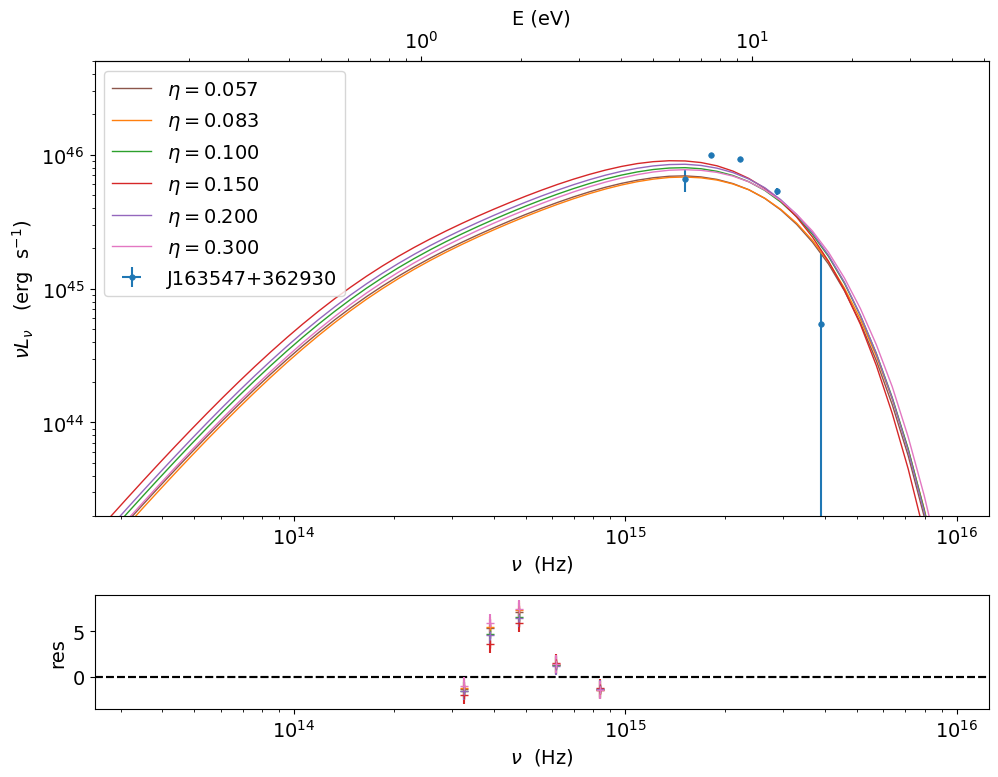

In [3]:
plt.rcParams.update({'font.size': 14})
d=np.genfromtxt('disk.txt')
data=Data(n_rows=d.shape[0])
data.set_field('x',d[:,0])
data.set_field('y',d[:,1])
data.set_field('dy',value=d[:,2])
data.set_meta_data('z',3.647763)
data.set_meta_data('restframe','obs')
data.set_meta_data('data_scale','lin-lin')
data.set_meta_data('obj_name','J163547+362930')
sed_data=ObsData(data_table=data)

my_disc=Jet(name='JetLeptonic',electron_distribution='bkn',beaming_expr='bulk_theta')
my_disc.add_EC_component(['EC_Disk',"EC_DT","EC_BLR"],disk_type='MultiBB')
my_disc.add_user_par(name='theta_open',val=3,units='deg')
my_disc.make_dependent_par(par='R', depends_on=['R_H','theta_open'],
                              par_expr='np.tan((theta_open*np.pi/180))*R_H')
my_disc.make_dependent_par(par='R_BLR_in', depends_on=['L_Disk'], par_expr='3E17*(L_Disk/1E46)**0.5')
my_disc.make_dependent_par(par='R_BLR_out', depends_on=['R_BLR_in'], par_expr='R_BLR_in*1.1')
my_disc.make_dependent_par(par='R_DT', depends_on=['L_Disk'], par_expr='2E19*(L_Disk/1E46)**0.5')

gmin=1
gmax=20000
N5=1148.063
gamma_break=882.9551
p=1.416318
p_1=3.609625
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.057
M_BH5=1147953000
T_DT=926.8273
R_DT=1.985557E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=2.978336E+017
R_BLR_out=3.276169E+017
L_Disk5=9.856093E+045
R_H5=1.2E+018
B5=0.07948746
NH_cold_to_rel_e=0.1
theta=3
BulkFactor5=19.99243
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N5)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH5)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk5)
my_disc.set_par('R_H',val=R_H5)
my_disc.set_par('B',val=B5)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor5)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(label=r'$\eta = 0.057$',comp='Disk', frame="src", sed_data=sed_data, color='#8c564b')
my_plot.add_residual_plot(my_disc,sed_data, color='#8c564b')

gmin=1
gmax=20000
N8=921.4208
gamma_break=946.3835
p=1.446258
p_1=3.576325
T_DT=926.8273
R_DT=2.373137E+019
tau_DT=0.1
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.083
M_BH8=1102905000
tau_BLR=0.1
R_BLR_in=3.559706E+017
R_BLR_out=3.915677E+017
L_Disk8=1.407945E+046
R=7.861166E+016
R_H8=1.5E+018
B8=0.06558658
NH_cold_to_rel_e=0.1
theta=3
BulkFactor8=19.03681
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N8)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH8)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk8)
my_disc.set_par('R_H',val=R_H8)
my_disc.set_par('B',val=B8)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor8)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.083$',comp='Disk', frame="src",color='#ff7f0e')
my_plot.add_residual_plot(my_disc,sed_data,color='#ff7f0e' )

gmin=1
gmax=20000
N1=769.9058
gamma_break=1065.102
p=1.410731
p_1=3.648568
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.1
M_BH1=1238069000
T_DT=926.8273
R_DT=2.822024E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=4.233036E+017
R_BLR_out=4.656339E+017
L_Disk1=1.990955E+046
R=9.434627E+016
R_H1=1.800234E+018
B1=0.04047604
NH_cold_to_rel_e=0.1
theta=3
BulkFactor1=15.6698
z_cosm=3.647763
theta_open=3


my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N1)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH1)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk1)
my_disc.set_par('R_H',val=R_H1)
my_disc.set_par('B',val=B1)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor1)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.100$',comp='Disk', frame="src",color='#2ca02c')
my_plot.add_residual_plot(my_disc,sed_data,color='#2ca02c')


gmin=1
gmax=20000
N15=901.3735
gamma_break=1243.69
p=1.409303
p_1=3.676444
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.15
M_BH15=1455790000
T_DT=926.8273
R_DT=3.672985E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=5.509478E+017
R_BLR_out=6.060426E+017
L_Disk15=3.372705E+046
R=1.10201E+017
R_H15=2.102759E+018
B15=0.02164112
NH_cold_to_rel_e=0.1
theta=3
BulkFactor15=13.15663
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N15)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH15)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk15)
my_disc.set_par('R_H',val=R_H15)
my_disc.set_par('B',val=B15)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor15)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.150$',comp='Disk', frame="src",color='#d62728')
my_plot.add_residual_plot(my_disc,sed_data,color='#d62728')

gmin=1
gmax=20000
N2=816.5674
gamma_break=1279.536
p=1.413925
p_1=3.662788
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.2
M_BH2=1300787000
T_DT=926.8273
R_DT=4.110404E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=6.165606E+017
R_BLR_out=6.782166E+017
L_Disk2=4.223855E+046
R=1.218604E+017
R_H2=2.325235E+018
B2=0.01895942
NH_cold_to_rel_e=0.1
theta=3
BulkFactor2=13.21123
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N2)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH2)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk2)
my_disc.set_par('R_H',val=R_H2)
my_disc.set_par('B',val=B2)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor2)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.200$',comp='Disk', frame="src",color='#9467bd')
my_plot.add_residual_plot(my_disc,sed_data,color='#9467bd')

gmin=1
gmax=20000
N3=603.0497
gamma_break=1228.689
p=1.45124
p_1=3.628523
R_inner_Sw=9.274387
R_ext_Sw=841.166
accr_eff=0.3
M_BH3=1148847000
T_DT=926.8273
R_DT=4.806335E+019
tau_DT=0.1
tau_BLR=0.1
R_BLR_in=7.209503E+017
R_BLR_out=7.930453E+017
L_Disk3=5.775215E+046
R=1.415606E+017
R_H3=2.701138E+018
B3=0.02232972
NH_cold_to_rel_e=0.1
theta=3
BulkFactor3=15.20138
z_cosm=3.647763
theta_open=3

my_disc.set_par('gmin',val=gmin)
my_disc.set_par('gmax',val=gmax)
my_disc.set_par('N',val=N3)
my_disc.set_par('gamma_break',val=gamma_break)
my_disc.set_par('p',val=p)
my_disc.set_par('p_1',val=p_1)
my_disc.set_par('R_inner_Sw',val=R_inner_Sw)
my_disc.set_par('R_ext_Sw',val=R_ext_Sw)
my_disc.set_par('accr_eff',val=accr_eff)
my_disc.set_par('M_BH',val=M_BH3)
my_disc.set_par('T_DT',val=T_DT)
my_disc.set_par('tau_DT',val=tau_DT)
my_disc.set_par('tau_BLR',val=tau_BLR)
my_disc.set_par('L_Disk',val=L_Disk3)
my_disc.set_par('R_H',val=R_H3)
my_disc.set_par('B',val=B3)
my_disc.set_par('theta',val=theta)
my_disc.set_par('BulkFactor',val=BulkFactor3)
my_disc.set_par('z_cosm',val=z_cosm)
my_disc.eval()
my_disc.energetic_report()
my_plot=my_disc.plot_model(my_plot,label=r'$\eta = 0.300$',comp='Disk', frame="src", color="#e377c2")
my_plot.add_residual_plot(my_disc,sed_data,color="#e377c2")
my_plot.setlim(x_min=2.50e13, x_max=1.25e16, y_min=2e43, y_max=5e46)
my_plot.sedplot.grid(False)
my_plot.sedplot.legend(loc='upper left',fontsize=14)
my_plot.save('disk_diff_3.png')

## SMBH Evolution

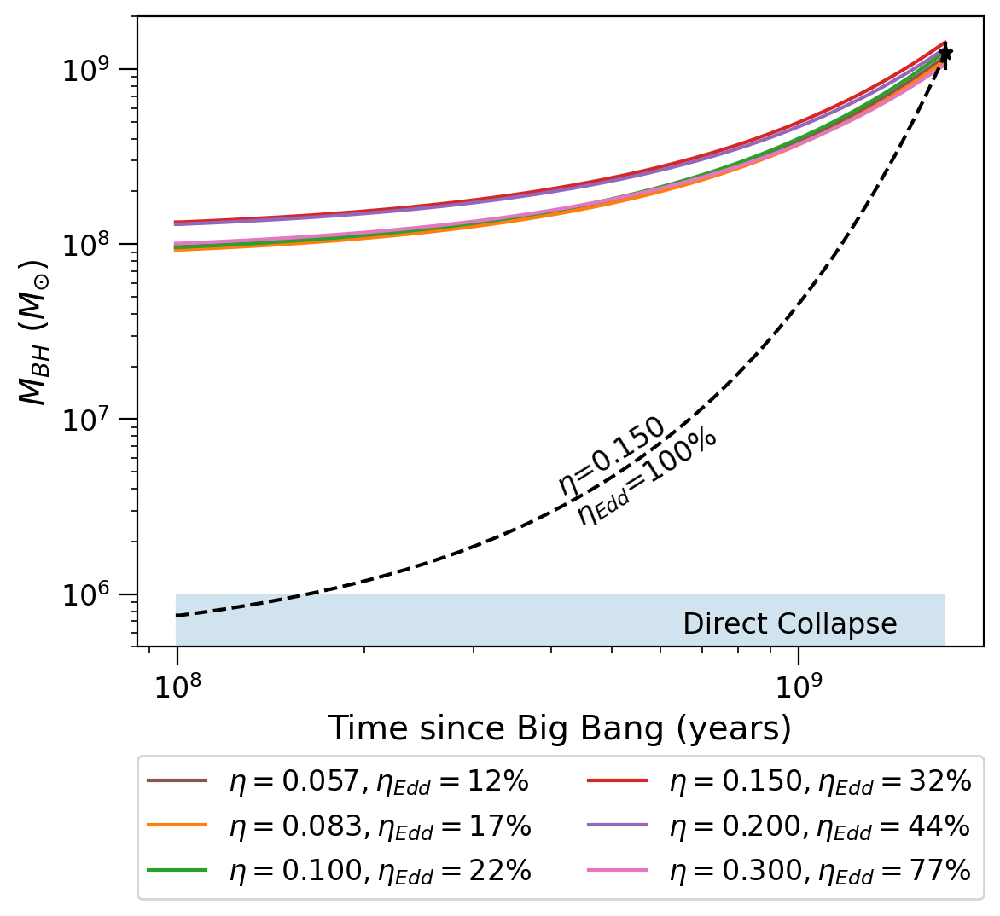

1.24


In [17]:
import numpy as np

# From MCMC

M_BH5=1.19e9
M_BH8=1.13e9
M_BH1=1.27e9
M_BH15=1.43e9
M_BH2=1.32e9
M_BH3=1.07e9

L_Disk5=9.96e45
L_Disk8=1.41e46
L_Disk1=2.01e46
L_Disk15=3.3e46
L_Disk2=4.22e46
L_Disk3=5.97e46


mmm = np.mean([M_BH5,M_BH8,M_BH1,M_BH15,M_BH2,M_BH3])

z30 = int(99.321E+06) #Using the calculator https://www.astro.ucla.edu/~wright/CosmoCalc.html & Planck 2013
z3  = int(1.722e+09)

def L_Edd(M):
    return ((8/7)*1.26e38)*(M/1.989e+30)

def tau(M):
    return (M*c**2)/L_Edd(M)

Lmm=1.26e38*mmm/2*(8/7)
c=3e8
e_m=np.array([0.057,0.083,0.100,0.150,0.200,0.300,0.150])
L_now=np.array([L_Disk5,L_Disk8,L_Disk1,L_Disk15,L_Disk2,L_Disk3,Lmm])*2
M_now=np.array([M_BH5,M_BH8,M_BH1,M_BH15,M_BH2,M_BH3,mmm])*1.989e+30
e_l = L_now/L_Edd(M_now)
ta = tau(M_now)
M_seed=M_now*np.exp(-(e_l*(1-e_m)/e_m)*(1/ta)*((z3-z30)))

z30 = int(99.321E+06) #Using the calculator https://www.astro.ucla.edu/~wright/CosmoCalc.html & Planck 2013
z3  = int(1.722e+09)

t = np.linspace(z30,z3,1000) 
M = np.zeros((len(e_m),len(t)))
for i in range(len(e_m)):
    for j in range(0,len(t)-1):
        if j==0:
            M[i][j] = M_seed[i]
        b = np.exp((e_l[i]*(1-e_m[i])/e_m[i])*(1/tau(M[i][j]))*(j*(z3-z30)/1000))
        M[i][j+1] = (M_seed[i]*b)

M = M/1.989e+30
import matplotlib.ticker as ticker
fig, ax = plt.subplots()
        
ax.loglog(t,M[0], label=fr"$\eta={e_m[0]:.3f}, \eta_{{Edd}}={e_l[0]*100:.0f}\%$", color='#8c564b')
ax.loglog(t,M[1], label=fr"$\eta={e_m[1]:.3f}, \eta_{{Edd}}={e_l[1]*100:.0f}\%$", color='#ff7f0e')
ax.loglog(t,M[2], label=fr"$\eta={e_m[2]:.3f}, \eta_{{Edd}}={e_l[2]*100:.0f}\%$", color='#2ca02c')
ax.loglog(t,M[3], label=fr"$\eta={e_m[3]:.3f}, \eta_{{Edd}}={e_l[3]*100:.0f}\%$", color='#d62728')
ax.loglog(t,M[4], label=fr"$\eta={e_m[4]:.3f}, \eta_{{Edd}}={e_l[4]*100:.0f}\%$", color='#9467bd')
ax.loglog(t,M[5], label=fr"$\eta={e_m[5]:.3f}, \eta_{{Edd}}={e_l[5]*100:.0f}\%$", color='#e377c2')
ax.loglog(t,M[6],  "--", color="k")
ax.fill_between(t, 10**4, 10**6, alpha=.2)
ax.annotate(r'Direct Collapse', xy = (6.5e8, 6e5), fontsize=12)

string = r"$\eta$=%.3f" % (e_m[6]) 
string += "\n"
string += r"$\eta_{Edd}$=%.0f" % (e_l[6]*100)+"%" 

ax.annotate(string, xy = (4e8, 2.5e6),
            fontsize=12, rotation=32)

#ax.fill_between(t, 10**3, 10**4, alpha=.5)
#ax.fill_between(t, 0, 10**2, alpha=.5)
ax.errorbar(z3,mmm,yerr=([[2.42270556808351e8],[2.04790006644047e8]]), marker="*", color="k")
ax.tick_params(axis='both', which='major', labelsize=12, length=8)
ax.tick_params(axis='both', which='minor', labelsize=12, length=3)
plt.ylim(5e5, 2e9)
ax.set_xlabel("Time since Big Bang (years)")
ax.set_ylabel(r"$M_{BH}$ ($M_{\odot}$)")
plt.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.savefig('BH_evolution_3.png')
plt.show()
print(np.round(mmm/1e9,2))

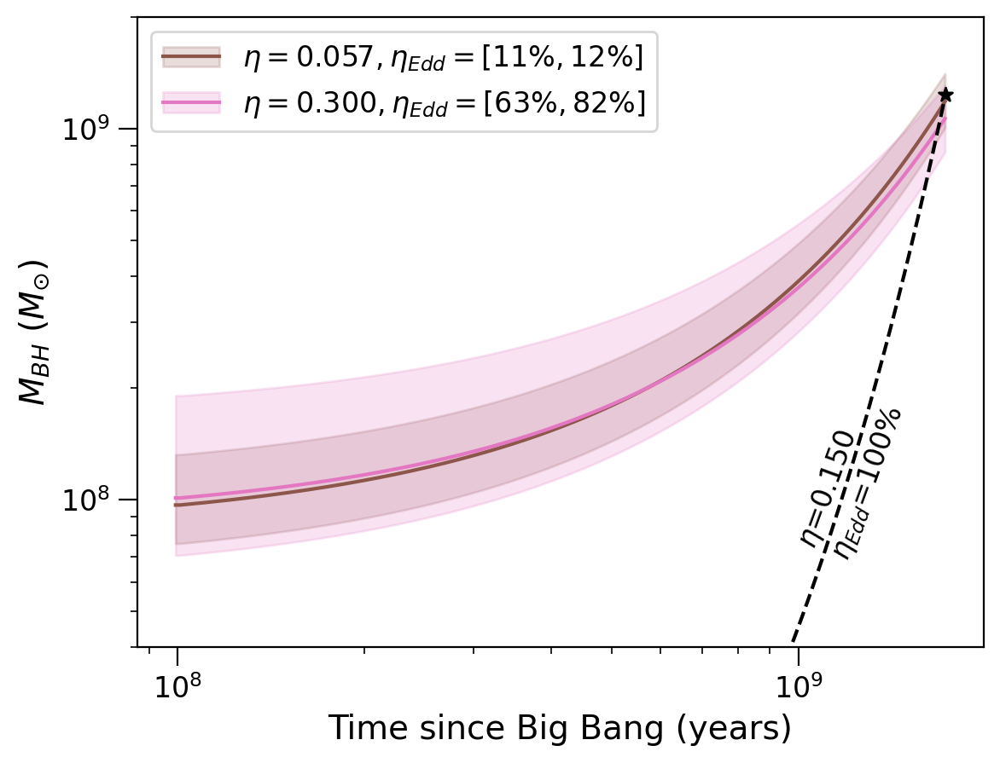

[0.11981225 0.1162465  0.10973695 0.82375479 0.77492212 0.63295165
 1.        ]


In [36]:
import numpy as np

# From MCMC

M_BH5=1.19e9
M_BH8=1.13e9
M_BH1=1.27e9
M_BH15=1.43e9
M_BH2=1.32e9
M_BH3=1.07e9

L_Disk5=9.96e45
L_Disk8=1.41e46
L_Disk1=2.01e46
L_Disk15=3.3e46
L_Disk2=4.22e46
L_Disk3=5.97e46


mmm = np.mean([M_BH5,M_BH8,M_BH1,M_BH15,M_BH2,M_BH3])

z30 = int(99.321E+06) #Using the calculator https://www.astro.ucla.edu/~wright/CosmoCalc.html & Planck 2013
z3  = int(1.722e+09)

def L_Edd(M):
    return ((8/7)*1.26e38)*(M/1.989e+30)

def tau(M):
    return (M*c**2)/L_Edd(M)

Lmm=1.26e38*mmm/2*(8/7)
c=3e8
e_m=np.array([0.057,0.057,0.057,0.300,0.3,0.3,0.150])
L_now=np.array([L_Disk5-1.23e45,L_Disk5,L_Disk5+1.22e45,L_Disk3-8.10e45,L_Disk3,L_Disk3+8.31,Lmm])*2
M_now=np.array([M_BH5-1.78e8,M_BH5,M_BH5+2.25e8,M_BH3-2.00e8,M_BH3,M_BH3+2.40e8,mmm])*1.989e+30
e_l = L_now/L_Edd(M_now)
ta = tau(M_now)
M_seed=M_now*np.exp(-(e_l*(1-e_m)/e_m)*(1/ta)*((z3-z30)))

t = np.linspace(z30,z3,1000) 
M = np.zeros((len(e_m),len(t)))
for i in range(len(e_m)):
    for j in range(0,len(t)-1):
        if j==0:
            M[i][j] = M_seed[i]
        b = np.exp((e_l[i]*(1-e_m[i])/e_m[i])*(1/tau(M[i][j]))*(j*(z3-z30)/1000))
        M[i][j+1] = (M_seed[i]*b)

M = M/1.989e+30
import matplotlib.ticker as ticker
fig, ax = plt.subplots()
        
p0 = ax.loglog(t,M[1], color='#8c564b')
p1 = ax.loglog(t,M[4], color='#e377c2')
ax.loglog(t,M[6],  "--",color="k")
p0_ = ax.fill_between(t, M[0], M[2], alpha=0.2, color="#8c564b")
p1_ = ax.fill_between(t, M[3], M[5], alpha=0.2, color="#e377c2")

string = r"$\eta$=%.3f" % (e_m[6]) 
string += "\n"
string += r"$\eta_{Edd}$=%.0f" % (e_l[6]*100)+"%" 

ax.annotate(string, xy = (9.8e8, 7e7),fontsize=12, rotation=70)
ax.scatter(z3, mmm, marker="*",color="k")
#ax.scatter(z3, M_BH5, marker="*", color="#8c564b")
#ax.scatter(z3, M_BH3, marker="*", color="#e377c2")
ax.tick_params(axis='both', which='major', labelsize=12, length=8)
ax.tick_params(axis='both', which='minor', labelsize=12, length=3)
plt.ylim(4e7, 2e9)
ax.set_xlabel("Time since Big Bang (years)")
ax.set_ylabel(r"$M_{BH}$ ($M_{\odot}$)")
leg = plt.legend([(p0[0], p0_),(p1[0], p1_) ],
                 [fr"$\eta={e_m[1]:.3f}, \eta_{{Edd}}=[{e_l[2]*100:.0f}\%,{e_l[0]*100:.0f}\%]$",
                  fr"$\eta={e_m[4]:.3f}, \eta_{{Edd}}=[{e_l[5]*100:.0f}\%,{e_l[3]*100:.0f}\%]$"],
                 fontsize=12)
#for lh in leg.legendHandles: 
    #lh.set_alpha(0.2)
    #lh.set_linewidth(5.0)
plt.savefig('BH_evolution_zoom3.png')
plt.show()
print(e_l)

# B vs $R_{diss}$

m = 0.956 ± 0.012 (one sigma)


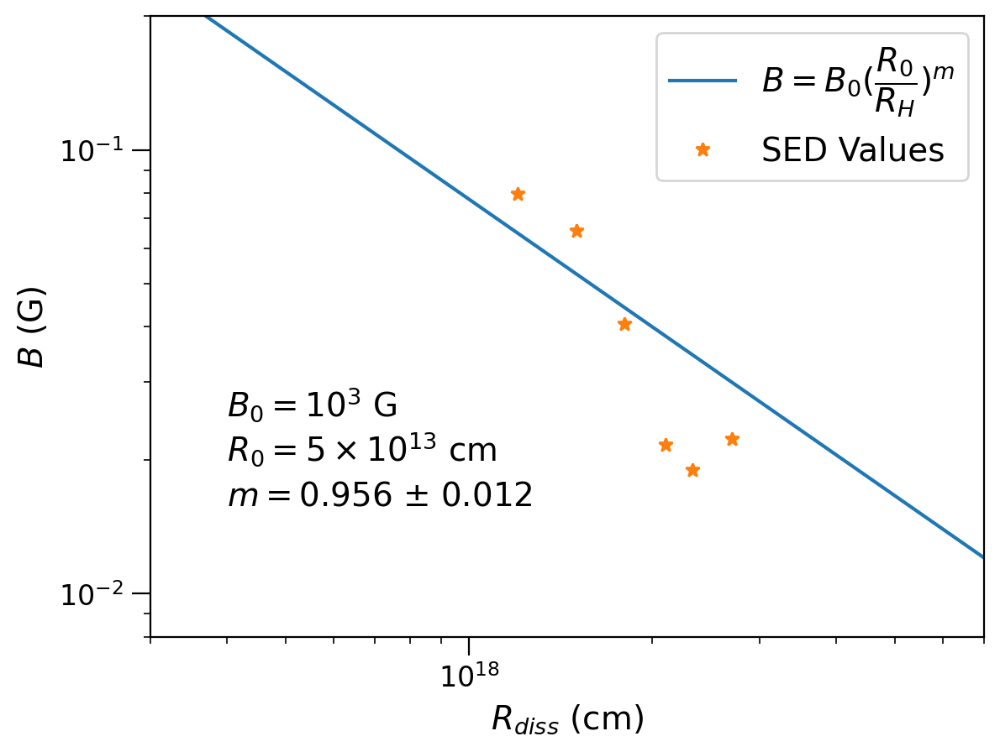

In [70]:
from scipy.optimize import curve_fit

def func(x,m):
    return 1e3*(5e13/x)**(m)

x = np.array([R_H5,R_H8,R_H1,R_H15,R_H2,R_H3])
y = np.array([B5,B8,B1,B15,B2,B3])

param, pcov = curve_fit(func, x, y, bounds=([0.90], [1.2]))

print(f'm = {np.round(param[0],3)} \u00B1 {np.round(np.sqrt(np.diag(pcov)[0]),3)} (one sigma)')

x2 = np.logspace(17,19,1000)
ans = func(x2,param[0])
m = np.round(param[0],3)

import matplotlib.ticker as ticker

fig, ax = plt.subplots()
ax.loglog(x2,ans,label=fr'$B=B_0(\dfrac{{R_0}}{{R_{{H}}}})^{{m}}$')
ax.loglog(x,y,"*",label="SED Values")
#ax.xaxis.set_major_locator(plt.MaxNLocator(8))
#ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.2f'))
#ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
#ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(axis='both', which='major', labelsize=12, length=8)
ax.tick_params(axis='both', which='minor', labelsize=12, length=3)
plt.text(4e17,np.power(10,-1.6), r'$B_{0} = 10^{{3}}$ G')
plt.text(4e17,np.power(10,-1.7), r'$R_{0} = 5\times10^{{13}}$ cm')
plt.text(4e17,np.power(10,-1.8), fr'$m = {np.round(param[0],3)}$ $\pm$ {np.round(np.sqrt(float(np.diag(pcov))),3)}')
#plt.arrow(x=1.1e18, y=0.018, dx=1.6e18, dy=0.0, width=.0008, color="k", head_length = 1e17) 
#plt.annotate(r'$\eta$', xy = (1.7e18, 0.02))
ax.set_xlabel(r"$R_{{diss}}$ (cm)")
ax.set_ylabel(r"$B$ (G)")
plt.xlim(3e17,7e18)
plt.ylim(8e-3,2e-1)
plt.legend()
plt.savefig('BvR_H_3.png',bbox_inches='tight')
plt.show()

# Electron distribution

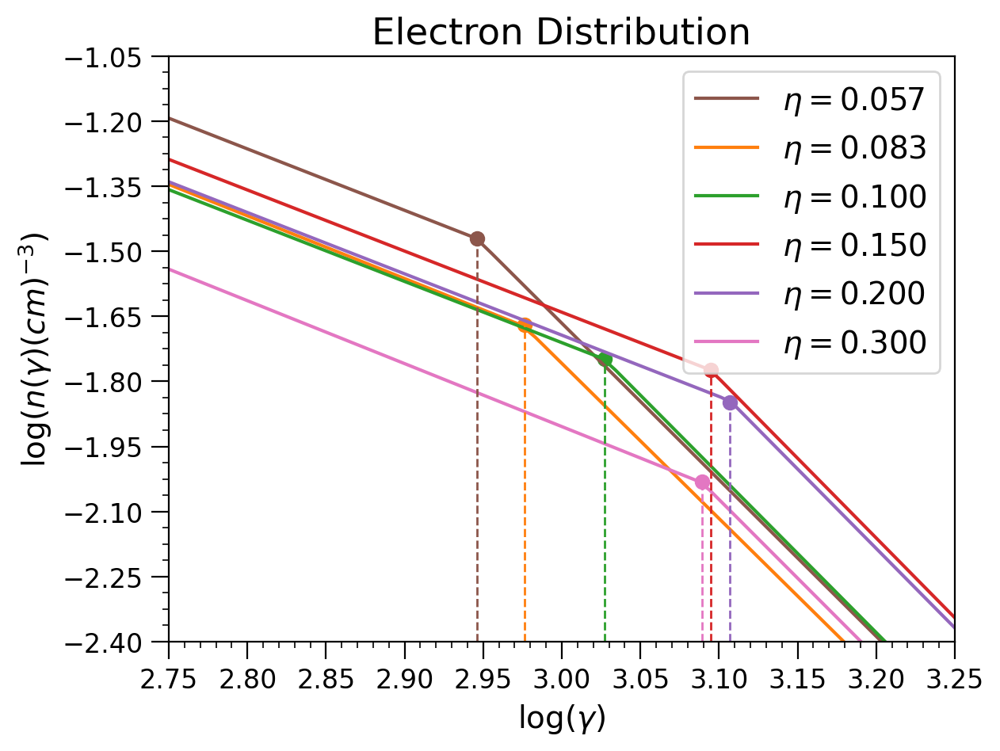

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad

gmin=1
gmax=20000

N5=1148.063
g_break5=882.9551
p5=1.416318
p_1_5=3.609625

N8=921.4208
g_break8=946.3835
p8=1.446258
p_1_8=3.576325


N1=769.9058
g_break1=1065.102
p1=1.410731
p_1_1=3.648568

N15=901.3735
g_break15=1243.69
p15=1.409303
p_1_15=3.676444

N2=816.5674
g_break2=1279.536
p2=1.413925
p_1_2=3.662788

N3=603.0497
g_break3=1228.689
p3=1.45124
p_1_3=3.628523

c5='#8c564b'
c8='#ff7f0e'
c1='#2ca02c'
c15='#d62728'
c2='#9467bd'
c3='#e377c2'

def broken_power_law(x, alpha1, alpha2, x_break):
    y = np.where(x < x_break, x ** (-alpha1), x_break ** (-(alpha1 - alpha2)) * x ** (-alpha2))
    return y

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

x = np.linspace(gmin, gmax, 1000)
I5 = quad(broken_power_law, gmin, gmax, args=(p5,p_1_5,g_break5))
y_5 = N5*broken_power_law(x,p5, p_1_5, g_break5)/I5[0]

I8 = quad(broken_power_law, gmin, gmax, args=(p8,p_1_8,g_break8))
y_8 = N8*broken_power_law(x,p8, p_1_8, g_break8)/I8[0]

I1 = quad(broken_power_law, gmin, gmax, args=(p1,p_1_1,g_break1))
y_1 = N1*broken_power_law(x,p1, p_1_1, g_break1)/I1[0]

I15 = quad(broken_power_law, gmin, gmax, args=(p15,p_1_15,g_break15))
y_15 = N15*broken_power_law(x,p15, p_1_15, g_break15)/I15[0]

I2 = quad(broken_power_law, gmin, gmax, args=(p2,p_1_2,g_break2))
y_2 = N2*broken_power_law(x,p2, p_1_2, g_break2)/I2[0]

I3 = quad(broken_power_law, gmin, gmax, args=(p3,p_1_3,g_break3))
y_3 = N3*broken_power_law(x,p3, p_1_3, g_break3)/I3[0]


import matplotlib.ticker as ticker
fig, ax = plt.subplots()
ax.plot(np.log10(x), np.log10(y_5), label=r'$\eta=0.057$', color=c5)
ax.plot(np.log10(x), np.log10(y_8), label=r'$\eta=0.083$', color=c8)
ax.plot(np.log10(x), np.log10(y_1), label=r'$\eta=0.100$', color=c1)
ax.plot(np.log10(x), np.log10(y_15), label=r'$\eta=0.150$', color=c15)
ax.plot(np.log10(x), np.log10(y_2), label=r'$\eta=0.200$', color=c2)
ax.plot(np.log10(x), np.log10(y_3), label=r'$\eta=0.300$', color=c3)
ax.set_xlabel(r'$\log(\gamma)$')
ax.set_ylabel(r'$\log(n(\gamma) (cm)^{-3})$')
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_ylim(-2.40,-1.05)
ax.set_xlim(2.75,3.25)
ax.scatter(np.log10(g_break5),np.log10(y_5[find_nearest(x,g_break5)]), color=c5)
ax.scatter(np.log10(g_break8),np.log10(y_8[find_nearest(x,g_break8)]), color=c8)
ax.scatter(np.log10(g_break1),np.log10(y_1[find_nearest(x,g_break1)]), color=c1)
ax.scatter(np.log10(g_break15),np.log10(y_15[find_nearest(x,g_break15)]), color=c15)
ax.scatter(np.log10(g_break2),np.log10(y_2[find_nearest(x,g_break2)]), color=c2)
ax.scatter(np.log10(g_break3),np.log10(y_3[find_nearest(x,g_break3)]), color=c3)
ax.vlines(x=np.log10(g_break5),ymin=-2.4,ymax=np.log10(y_5[find_nearest(x,g_break5)]), color=c5, linestyle='--', linewidth=1.0)
ax.vlines(x=np.log10(g_break8),ymin=-2.4,ymax=np.log10(y_8[find_nearest(x,g_break8)]), color=c8, linestyle='--', linewidth=1.0)
ax.vlines(x=np.log10(g_break1),ymin=-2.4,ymax=np.log10(y_1[find_nearest(x,g_break1)]), color=c1, linestyle='--', linewidth=1.0)
ax.vlines(x=np.log10(g_break15),ymin=-2.4,ymax=np.log10(y_15[find_nearest(x,g_break15)]),color=c15,linestyle='--',linewidth=1.0)
ax.vlines(x=np.log10(g_break2),ymin=-2.4,ymax=np.log10(y_2[find_nearest(x,g_break2)]), color=c2, linestyle='--', linewidth=1.0)
ax.vlines(x=np.log10(g_break3),ymin=-2.4,ymax=np.log10(y_3[find_nearest(x,g_break3)]), color=c3, linestyle='--', linewidth=1.0)
ax.xaxis.set_major_locator(plt.MaxNLocator(10))
ax.yaxis.set_major_locator(plt.MaxNLocator(10))
#ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%1.0E'))
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(axis='both', which='major', labelsize=12, length=8)
ax.tick_params(axis='both', which='minor', labelsize=12, length=3)
plt.legend()
plt.title('Electron Distribution')
plt.savefig('ED_3.png',bbox_inches='tight', dpi=200)
plt.show()

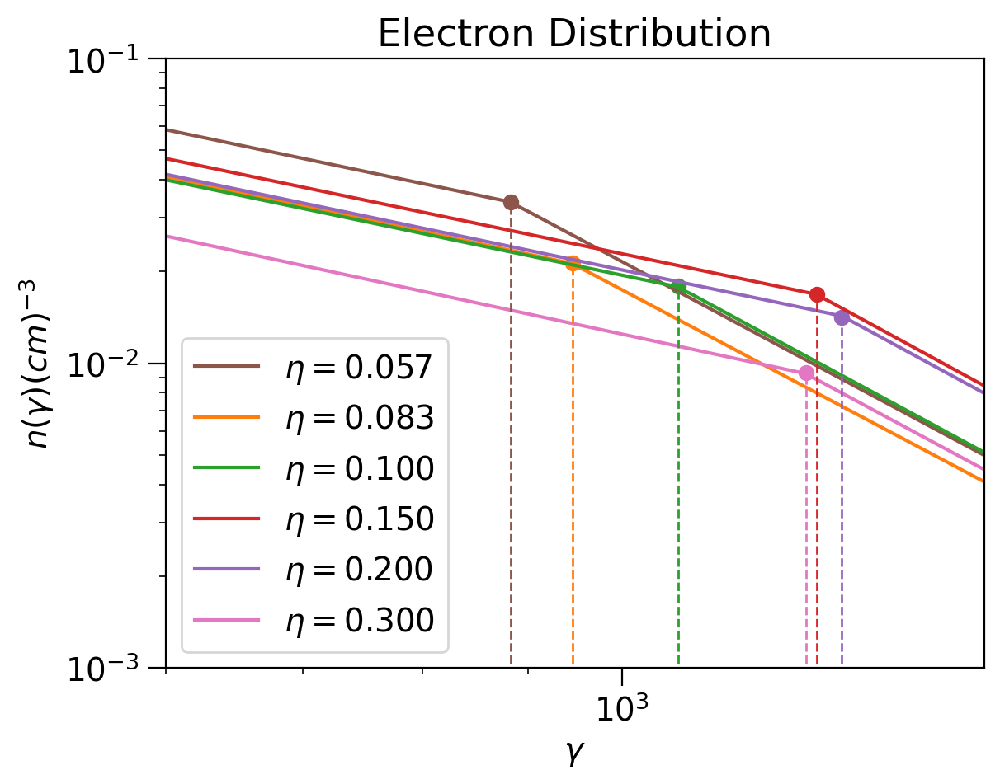

In [30]:
from matplotlib.ticker import StrMethodFormatter, NullFormatter
fig, ax = plt.subplots()
ax.loglog(x, y_5, label=r'$\eta=0.057$', color=c5)
ax.loglog(x, y_8, label=r'$\eta=0.083$', color=c8)
ax.loglog(x, y_1, label=r'$\eta=0.100$', color=c1)
ax.loglog(x, y_15, label=r'$\eta=0.150$', color=c15)
ax.loglog(x, y_2, label=r'$\eta=0.200$', color=c2)
ax.loglog(x, y_3, label=r'$\eta=0.300$', color=c3)
ax.set_xlabel(r'$\gamma$')
ax.set_ylabel(r'$n(\gamma) (cm)^{-3}$')
ax.set_ylim(1e-3,1e-1)
ax.set_xlim(600,1500)
ax.scatter(g_break5,y_5[find_nearest(x,g_break5)], color=c5)
ax.scatter(g_break8,y_8[find_nearest(x,g_break8)], color=c8)
ax.scatter(g_break1,y_1[find_nearest(x,g_break1)], color=c1)
ax.scatter(g_break15,y_15[find_nearest(x,g_break15)], color=c15)
ax.scatter(g_break2,y_2[find_nearest(x,g_break2)], color=c2)
ax.scatter(g_break3,y_3[find_nearest(x,g_break3)], color=c3)
ax.vlines(x=g_break5,ymin=-2.4,ymax=y_5[find_nearest(x,g_break5)], color=c5, linestyle='--', linewidth=1.0)
ax.vlines(x=g_break8,ymin=-2.4,ymax=y_8[find_nearest(x,g_break8)], color=c8, linestyle='--', linewidth=1.0)
ax.vlines(x=g_break1,ymin=-2.4,ymax=y_1[find_nearest(x,g_break1)], color=c1, linestyle='--', linewidth=1.0)
ax.vlines(x=g_break15,ymin=-2.4,ymax=y_15[find_nearest(x,g_break15)],color=c15,linestyle='--',linewidth=1.0)
ax.vlines(x=g_break2,ymin=-2.4,ymax=y_2[find_nearest(x,g_break2)], color=c2, linestyle='--', linewidth=1.0)
ax.vlines(x=g_break3,ymin=-2.4,ymax=y_3[find_nearest(x,g_break3)], color=c3, linestyle='--', linewidth=1.0)
ax.xaxis.set_minor_formatter(NullFormatter())
ax.tick_params(axis='both', which='major', length=8)
ax.tick_params(axis='both', which='minor', length=3)
plt.legend()
plt.title('Electron Distribution')
plt.show()

# MCMC
# steps=75, bound=5.0 for all $\eta$

## $\eta=0.057$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2557.43 seconds


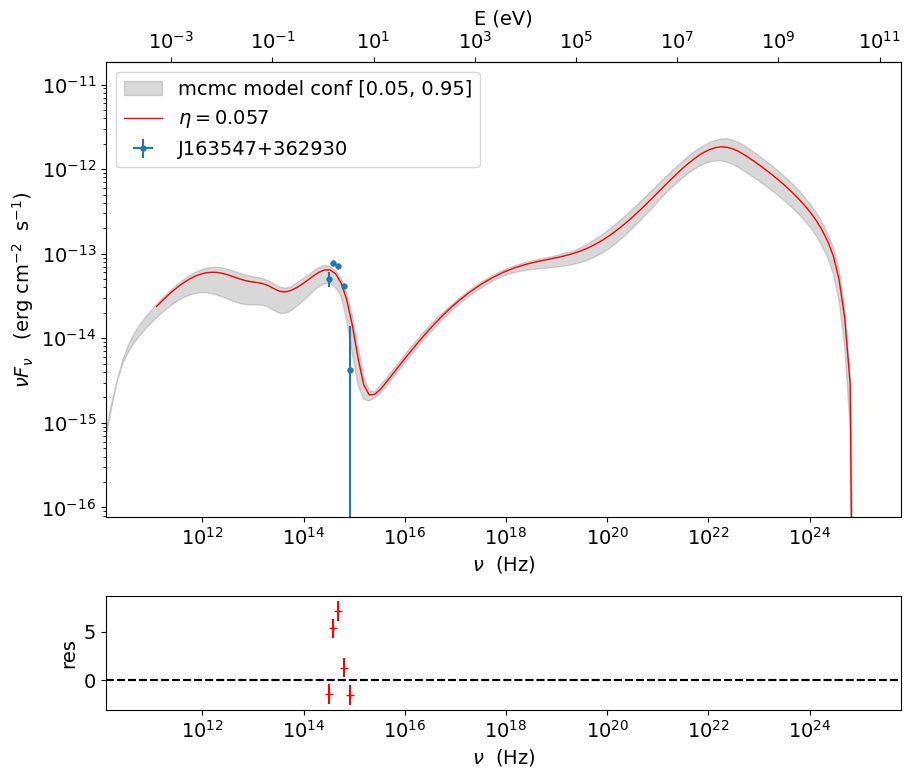

In [31]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_5_3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14)

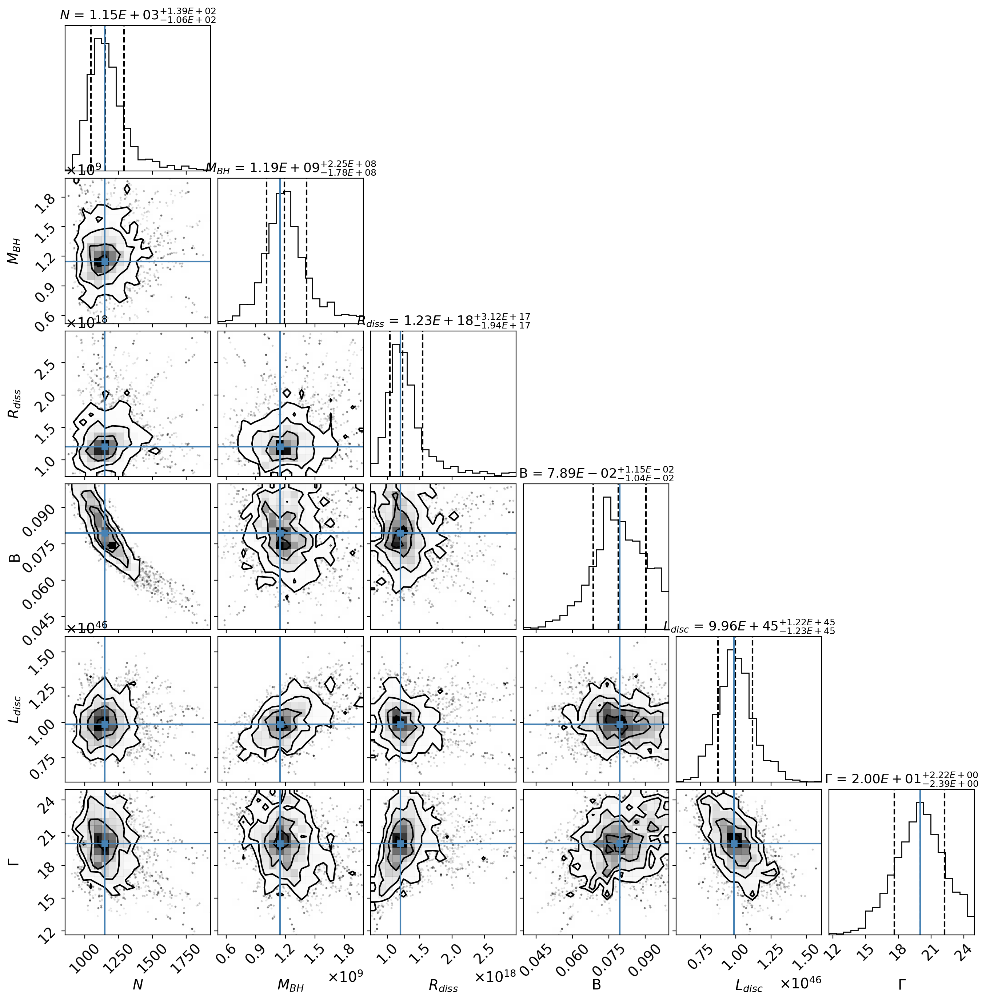

In [32]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_5_3.pkl')
#$1.15^{+0.14}_{-0.11}\times10^{3}$
#$1.19^{+0.23}_{-0.18}\times10^{9}$
#$1.23^{+0.31}_{-0.19}\times10^{18}$
#$7.89^{+0.12}_{-0.10}\times10^{-2}$
#$9.96^{+1.22}_{-1.23}\times10^{45}$
#$2.00^{+0.22}_{-0.24}\times10^{1}$

# $\eta=0.083$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2599.09 seconds


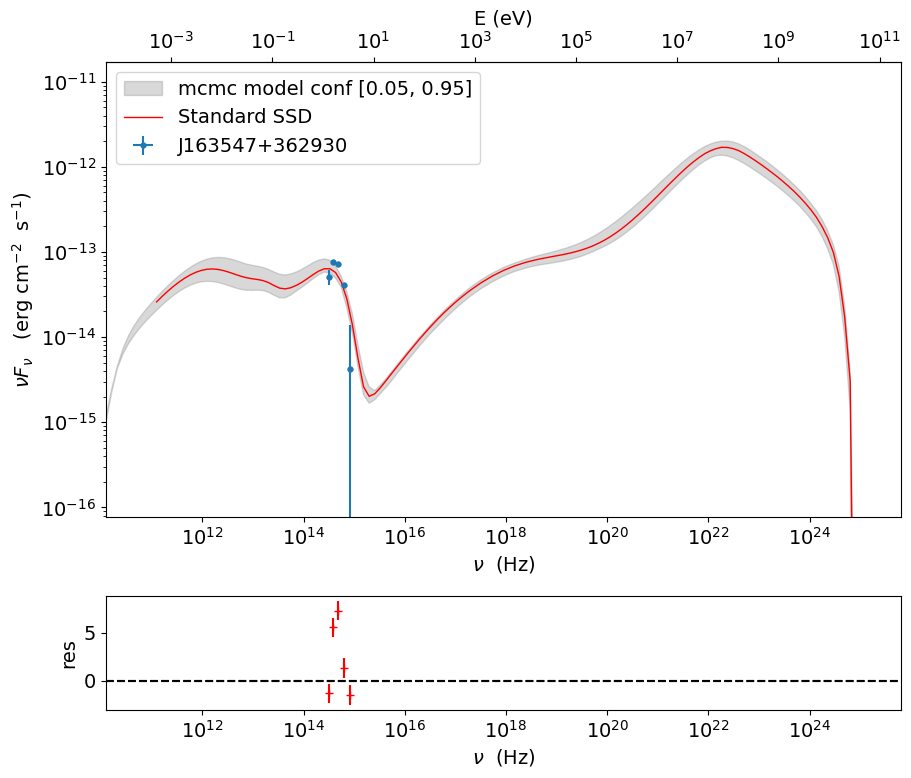

In [33]:
model_minimizer_minuit = ModelMinimizer.load_model('/home/chema/Desktop/Astro&Cosmo/Thesis/JetSET/PrePrefit_A/model_minimizer_PrePre3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
#mcmc.model.jet_leptonic.set_external_field_transf('disk')
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

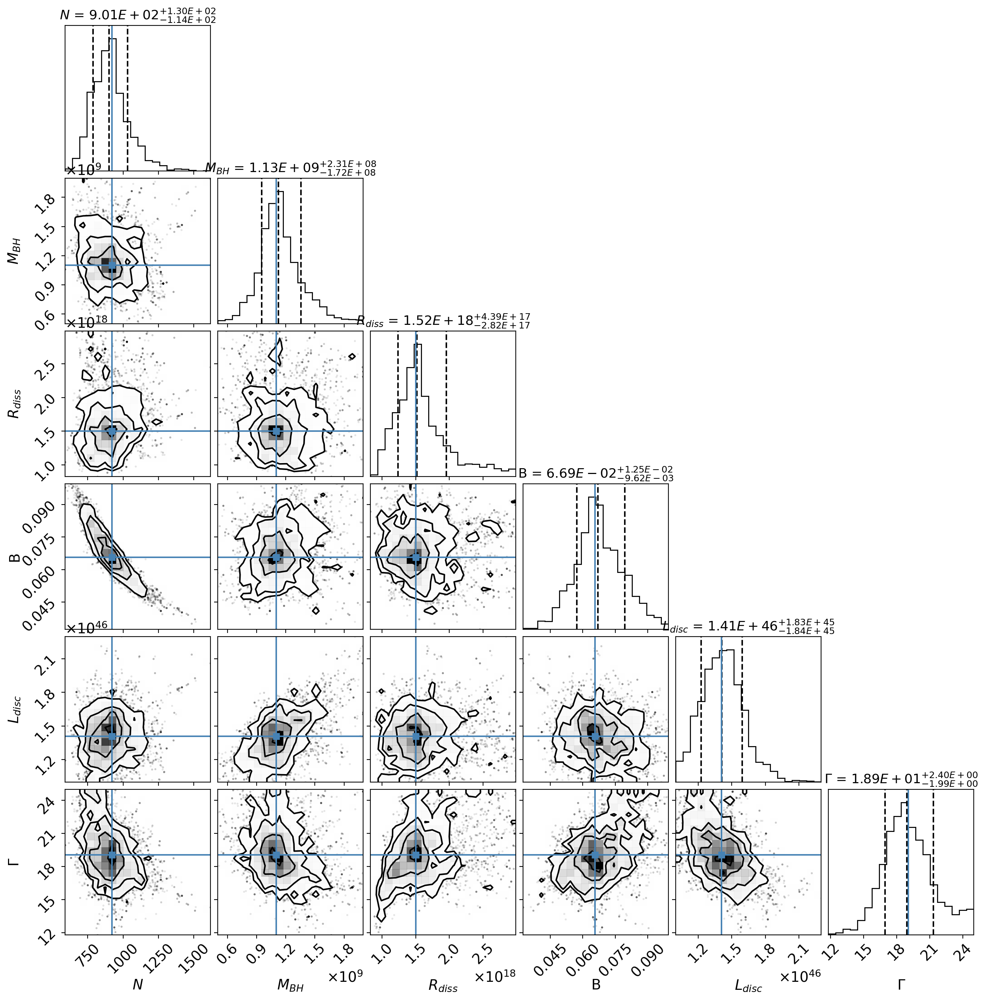

In [34]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_8_3.pkl')
#$9.01^{+1.30}_{-1.14}\times10^{2}$
#$1.13^{+0.23}_{-0.17}\times10^{9}$
#$1.52^{+0.44}_{-0.28}\times10^{18}$
#$6.69^{+0.13}_{-0.09}\times10^{-2}$
#$1.41^{+0.18}_{-0.18}\times10^{46}$
#$1.89^{+0.24}_{-0.20}\times10^{1}$

# $\eta=0.100$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2798.52 seconds


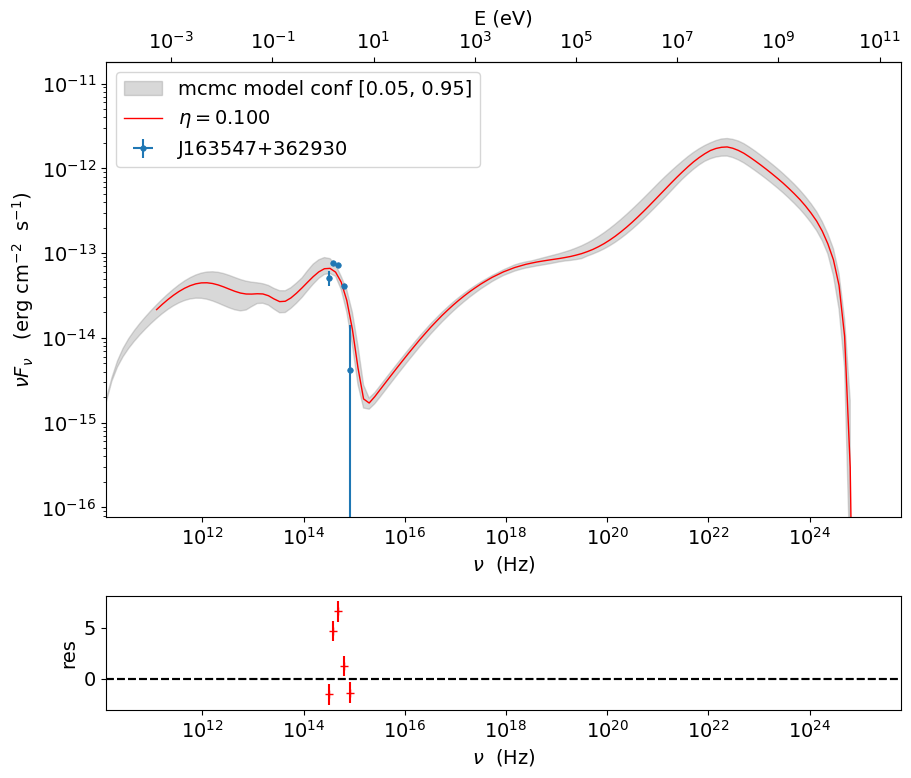

In [35]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_1_3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

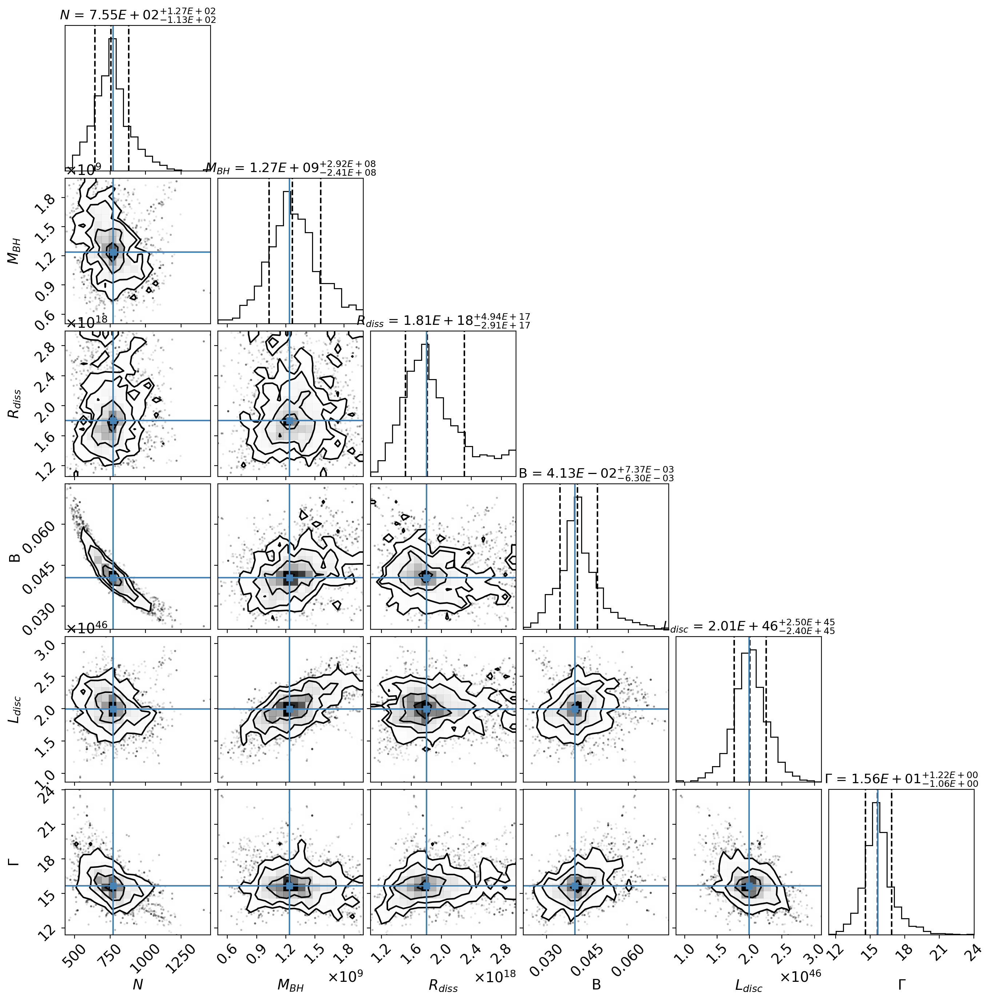

In [36]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_1_3.pkl')
#$7.55^{+1.27}_{-1.13}\times10^{2}$
#$1.27^{+0.29}_{-0.24}\times10^{9}$
#$1.81^{+0.49}_{-0.29}\times10^{18}$
#$4.13^{+0.74}_{-0.63}\times10^{-2}$
#$2.01^{+0.25}_{-0.24}\times10^{46}$
#$1.56^{+0.12}_{-0.10}\times10^{1}$

# $\eta=0.150$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2755.46 seconds


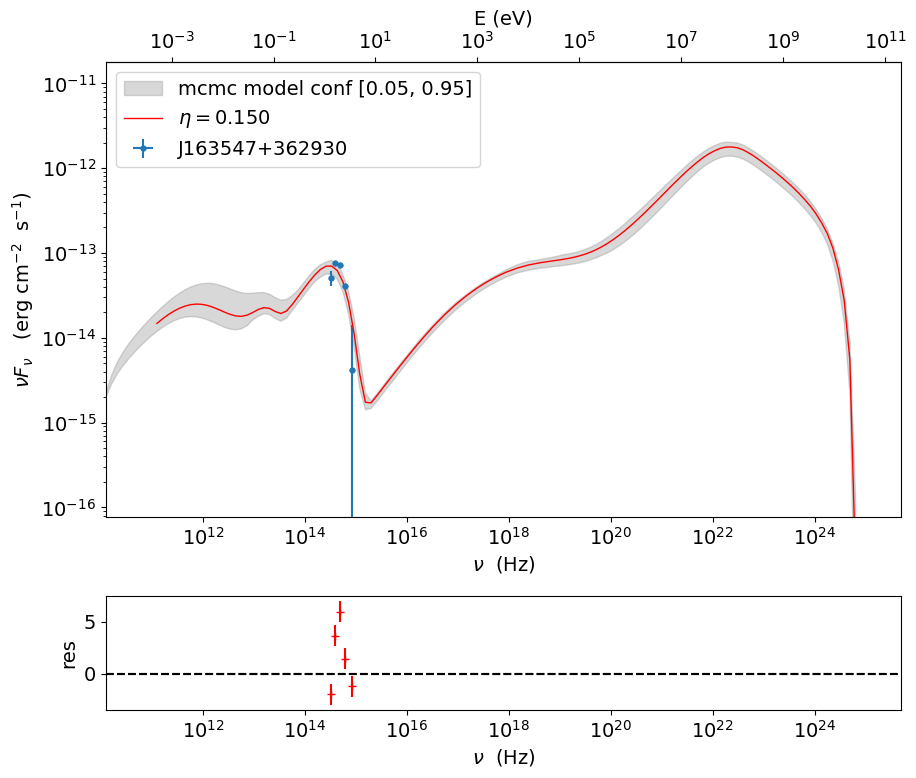

In [37]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_1_5_3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

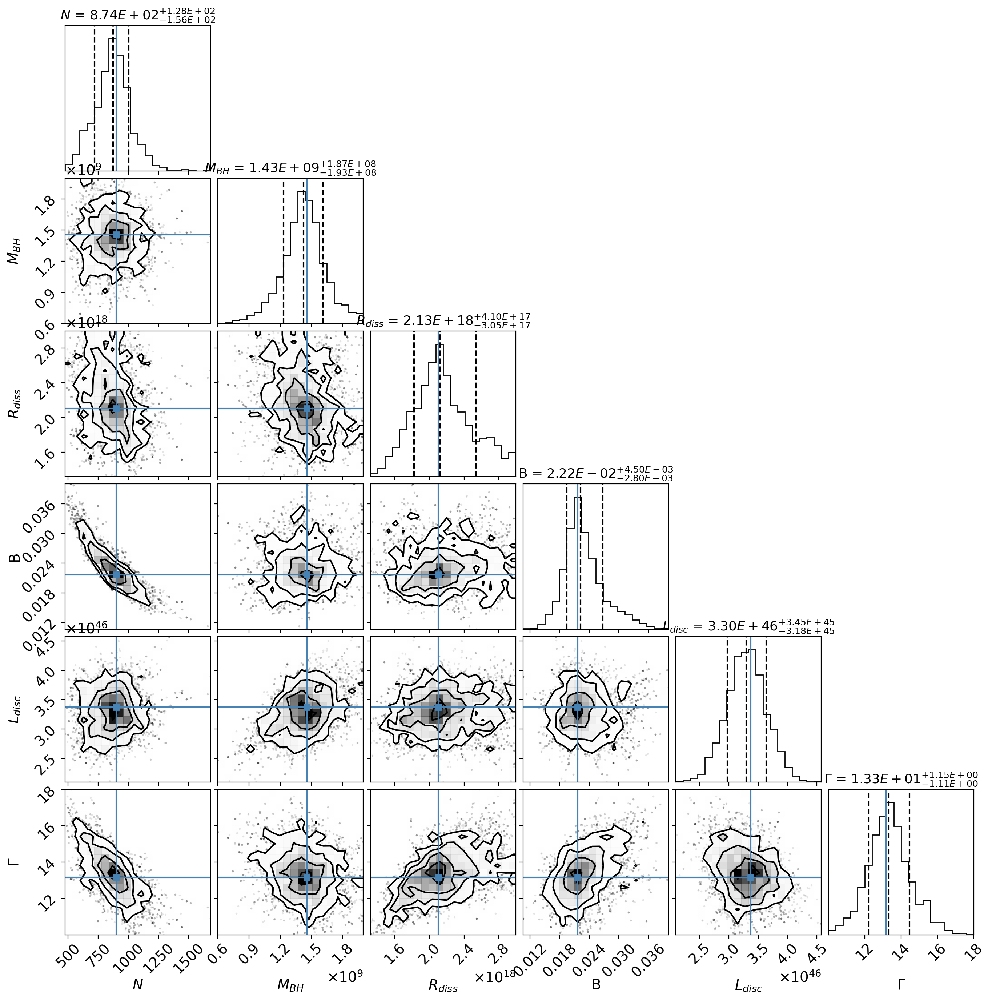

In [38]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_1_5_3.pkl')
#$8.74^{+1.28}_{-1.56}\times10^{2}$
#$1.43^{+0.19}_{-0.19}\times10^{9}$
#$2.13^{+0.41}_{-0.31}\times10^{18}$
#$2.22^{+0.45}_{-0.28}\times10^{-2}$
#$3.30^{+0.35}_{-0.32}\times10^{46}$
#$1.33^{+0.12}_{-0.11}\times10^{1}$

# $\eta=0.200$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2728.34 seconds


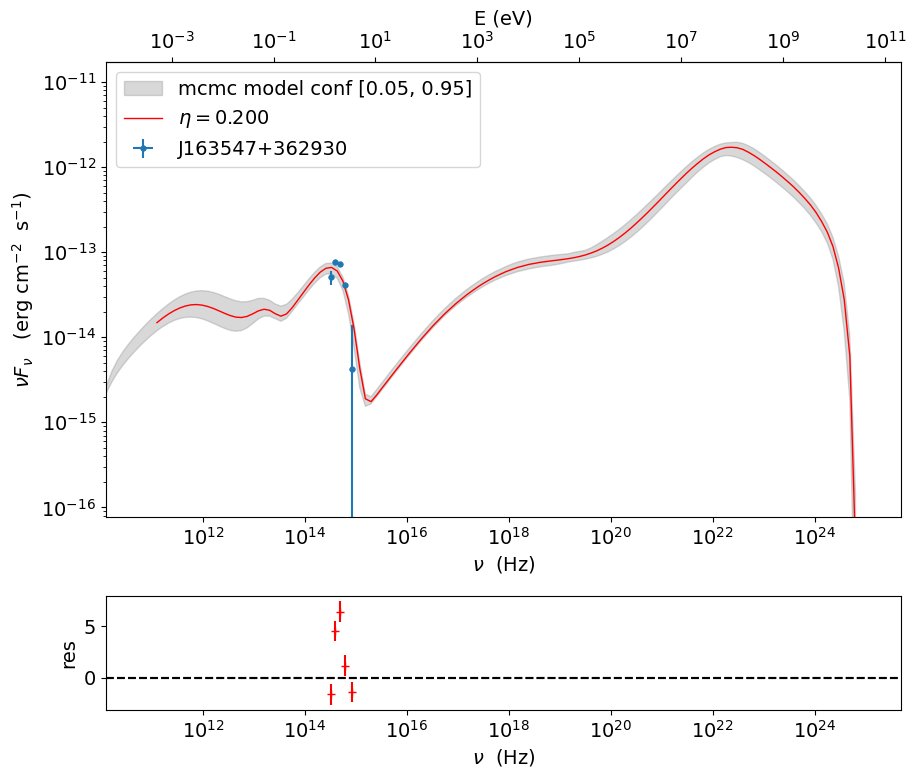

In [39]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_2_3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

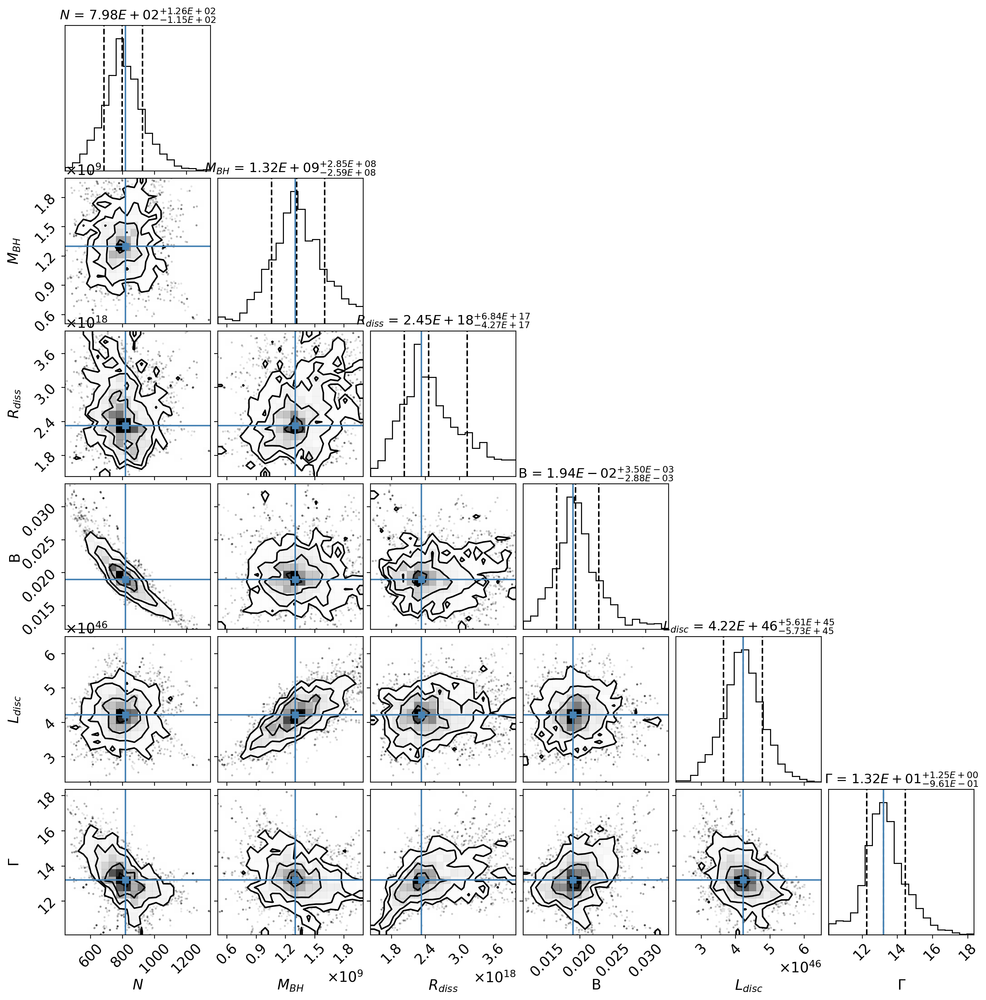

In [40]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_2_3.pkl')
#$7.98^{+1.26}_{-1.15}\times10^{2}$
#$1.32^{+0.29}_{-0.26}\times10^{9}$
#$2.45^{+0.68}_{-0.43}\times10^{18}$
#$1.94^{+0.35}_{-0.29}\times10^{-2}$
#$4.22^{+0.56}_{-0.57}\times10^{46}$
#$1.32^{+0.13}_{-0.10}\times10^{1}$

# $\eta=0.300$

mcmc run starting



  0%|          | 0/75 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 2707.34 seconds


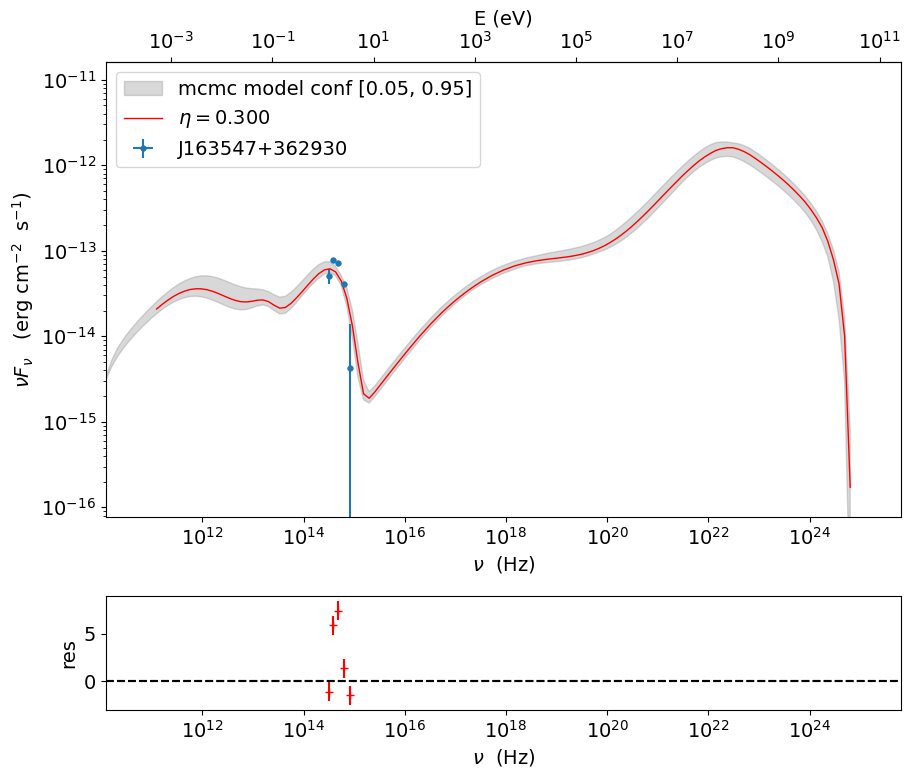

In [41]:
model_minimizer_minuit = ModelMinimizer.load_model('model_minimizer_3_3.pkl')

mcmc=McmcSampler(model_minimizer_minuit)
mcmc.model.jet_leptonic._blob.N_THREADS=8
labels=['N','M_BH','R_H','B','L_Disk','BulkFactor']
model_name='jet_leptonic'
use_labels_dict={model_name:labels}

mcmc.run_sampler(nwalkers=128,burnin=10,steps=75,
                 bound=5.0,bound_rel=True,threads=None,
                 walker_start_bound=0.005,
                 use_labels_dict=use_labels_dict,
                 progress='notebook')
p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E11,2E28],size=20, quantiles=[0.05,0.95])
p.sedplot.grid(False)
p.sedplot.legend(loc='upper left',fontsize=14) 

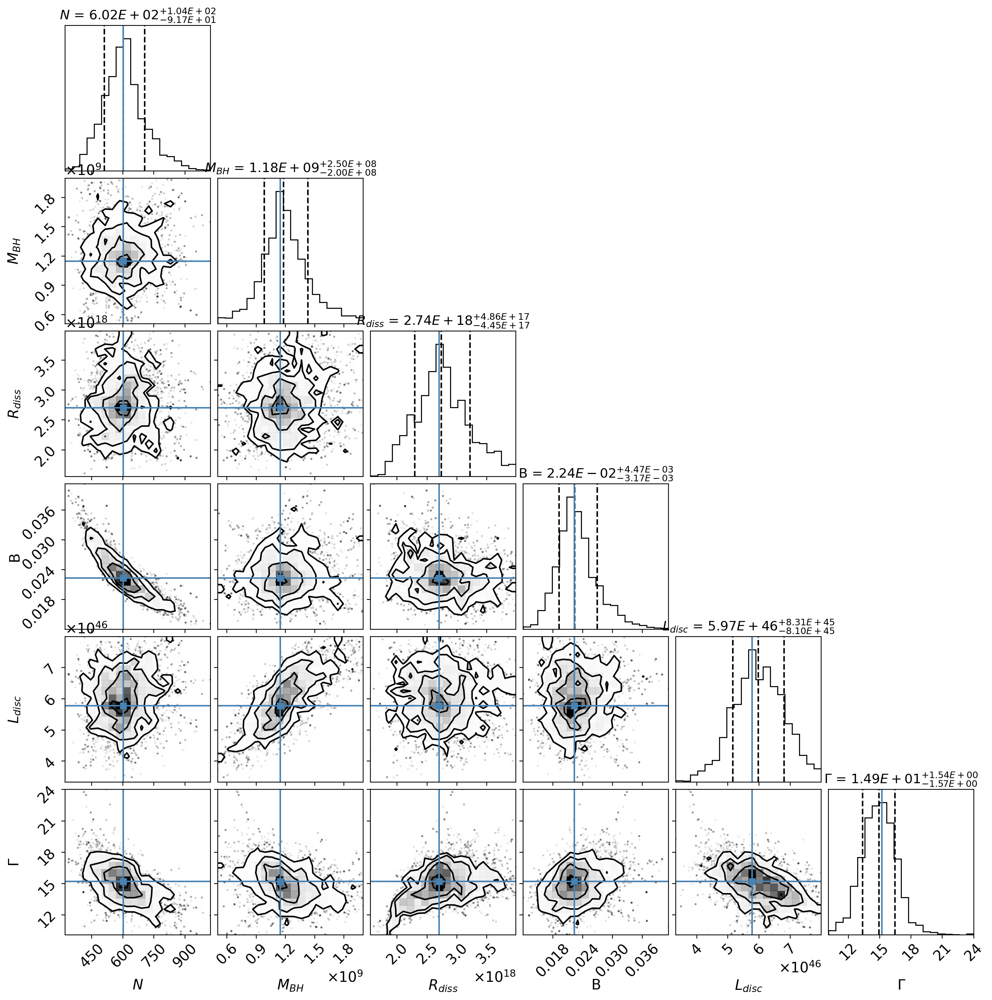

In [42]:
labes=[r'$N$',r'$M_{BH}$',r'$R_{diss}$','B',r'$L_{disc}$',r'$\Gamma$']
plt.rcParams['figure.dpi'] = 200
from corner import corner

f=corner(mcmc.samples,labels=labes, quantiles=(0.16, 0.5, 0.84),
       truths=mcmc.labels_start_val, show_titles = True, 
       title_fmt=".2E",title_kwargs=dict(fontsize=13),
       use_math_text=True)
mcmc.save('mcmc_3_3.pkl')
#$6.02^{+1.04}_{-0.92}\times10^{2}$
#$1.07^{+0.24}_{-0.19}\times10^{9}$
#$2.76^{+0.53}_{-0.41}\times10^{18}$
#$2.94^{+0.59}_{-0.50}\times10^{-2}$
#$5.72^{+0.81}_{-0.63}\times10^{46}$
#$1.48^{+0.15}_{-0.15}\times10^{1}$